# Jailbreaking Deep Models

Much of the class has focused on training deep neural networks that perform well on
certain tasks. In this final project you are tasked with launching effective adversarial
attacks on production grade, publicly posted models, and degrade their performance.
We will focus on image classifiers. Recall that we had discussed in class that deep
classifiers are surprisingly brittle; an attacker can carefully designed perturbations that
misclassify a test data point, and therefore reduce model performance to very low rates
(even all the way down to 0%).



The main challenge is to design attacks that are subtle or imperceptible; that is, the
perturbed test image should resemble the original test image as much as possible.
Mathematically, we require that the distance (measured in some sense) between the
original and test images are small. Typical measures of distance in such cases are the $L_\infty$
distance (which upper-bounds how much each image pixel is allowed to be perturbed;
these are called $L_\infty$ or pixel-wise attacks), and the $L_0$ distance (which upper-bounds
how many pixels are allowed to be perturbed; these are called $L_0$ or patch attacks.)


In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np
import json
import os
from PIL import Image
import matplotlib.pyplot as plt
import scipy.stats as stats

In [2]:
import zipfile
import os

def extract_zip(zip_path, extract_to="./TestData"):
    """
    Extract a zip file to a specified directory
    """
    if not os.path.exists(extract_to):
        os.makedirs(extract_to)

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

    print(f"Extracted {zip_path} to {extract_to}")

# Example usage:
extract_zip("TestDataSet.zip", "./")

Extracted TestDataSet.zip to ./


# Loading the dataset and mapping the labels

The code creates crucial mapping dictionaries that connect our dataset's indices with the official ImageNet class indices. This is necessary because:

1. **Class Index Translation**: Our local dataset uses indices from 0-99 (for 100 classes), while the ImageNet dataset uses a different numbering system with specific indices for its 1000 classes.

2. **Bidirectional Mapping**: The code creates two important dictionaries:
  - `dataset_to_imagenet`: Translates our local dataset indices to the corresponding ImageNet indices
  - `imagenet_to_dataset`: Translates ImageNet indices back to our local dataset indices

3. **Label Text Mapping**: The code also creates `imagenet_label_map` which connects ImageNet class indices directly to human-readable class names (like "tench" or "goldfish").

These mappings are essential because:
- The ResNet-34 model was trained on ImageNet and outputs predictions using ImageNet indices
- Our test dataset uses a different indexing system (0-99)
- We need to convert between these numbering systems to properly evaluate model performance

The verification output confirms the mapping is working correctly by showing how dataset indices 0 and 99 map to their corresponding ImageNet indices.

In [3]:
with open('./TestDataSet/labels_list.json', 'r') as f:
    labels_list = json.load(f)


imagenet_label_map = {}
for label in labels_list:
    index, name = label.split(': ', 1)
    imagenet_label_map[int(index)] = name


dataset_to_imagenet = {}
imagenet_to_dataset = {}
for i, label in enumerate(labels_list):
    index, name = label.split(': ', 1)
    dataset_to_imagenet[i] = int(index)
    imagenet_to_dataset[int(index)] = i

print("Mapping created:")
print("Dataset index 0 maps to ImageNet index:", dataset_to_imagenet[0])
print("Dataset index 99 maps to ImageNet index:", dataset_to_imagenet[99])

Mapping created:
Dataset index 0 maps to ImageNet index: 401
Dataset index 99 maps to ImageNet index: 500


# Loading the model

# Task 1

## Image Preprocessing and Model Evaluation

This section of code handles two critical aspects of our project: preparing the image data and evaluating the model's performance.

### Data Preprocessing

The preprocessing step transforms our raw images into the format expected by the ResNet-34 model:

- **Normalization Values**: The model expects images normalized with specific mean ($\mu$) and standard deviation ($\sigma$) values for each RGB channel. These values are standard for ImageNet-trained models.

- **Image Transformations**: The `transforms.Compose` combines multiple operations:
 - `ToTensor()`: Converts PIL images to tensors and scales pixel values from [0, 255] to [0, 1]
 - `Normalize()`: Standardizes each channel using the formula: $\text{output} = \frac{\text{input} - \mu}{\sigma}$

- **Dataset Loading**: The code loads images from the test directory using PyTorch's `ImageFolder`, which automatically:
 - Organizes images into classes based on folder structure
 - Assigns numerical labels (0-99) to each class
 - Applies the specified transformations to each image

### Model Evaluation Function

The `evaluate_model` function assesses the model's performance using two metrics:

1. **Top-1 Accuracy**: The percentage of images where the model's highest confidence prediction matches the true label. This is the strictest evaluation criterion.

2. **Top-5 Accuracy**: The percentage of images where the true label appears anywhere among the model's five highest confidence predictions. This is a more forgiving metric commonly used for complex classification tasks like ImageNet.

3. **Label Translation**: The function handles the crucial step of converting between our dataset's class indices and ImageNet indices using:
  - `dataset_to_imagenet`: Maps our dataset labels to the corresponding ImageNet labels
  - This ensures we're comparing the model's predictions (in ImageNet index space) to the correct ground truth labels

The final output gives us our baseline performance metrics before any adversarial attacks are implemented.

In [5]:
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])

plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])


dataset_path = "./TestDataSet"
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)


test_loader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=False, num_workers=0)

print(f"Test dataset size: {len(dataset)}")
print(f"Number of classes: {len(dataset.classes)}")

Test dataset size: 500
Number of classes: 100


In [6]:
def evaluate_model(model, dataloader, imagenet_label_map, dataset_to_imagenet, k=5):
    """
    Evaluate the model's top-1 and top-k accuracy
    """
    model.eval()
    correct_top1 = 0
    correct_topk = 0
    total = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)


            outputs = model(images)


            _, top_pred = torch.topk(outputs, k, dim=1)


            true_imagenet_labels = torch.tensor([dataset_to_imagenet[label.item()] for label in labels]).to(device)


            correct_top1 += (top_pred[:, 0] == true_imagenet_labels).sum().item()

            # Check top-k accuracy
            for i in range(len(labels)):
                if true_imagenet_labels[i] in top_pred[i]:
                    correct_topk += 1

            total += labels.size(0)


    top1_accuracy = 100 * correct_top1 / total
    topk_accuracy = 100 * correct_topk / total


    print(f"Top-1 Accuracy: {top1_accuracy:.2f}%")
    print(f"Top-{k} Accuracy: {topk_accuracy:.2f}%")

    return top1_accuracy, topk_accuracy


top1_acc, top5_acc = evaluate_model(pretrained_model, test_loader, imagenet_label_map, dataset_to_imagenet, k=5)

Top-1 Accuracy: 76.00%
Top-5 Accuracy: 94.20%


## Baseline Model Performance Analysis

The evaluation of our pre-trained ResNet-34 model on the test dataset has yielded the following results:

- **Top-1 Accuracy: 76.00%**
- **Top-5 Accuracy: 94.20%**

### Interpretation of Results

These metrics provide our baseline performance before implementing any adversarial attacks:

1. **Top-1 Accuracy (76.00%)**: 
  - This indicates that for 76% of the test images, the model correctly identified the exact class with the highest confidence.
    

2. **Top-5 Accuracy (94.20%)**:
  - For 94.20% of the images, the correct class appears somewhere among the model's top 5 predictions.



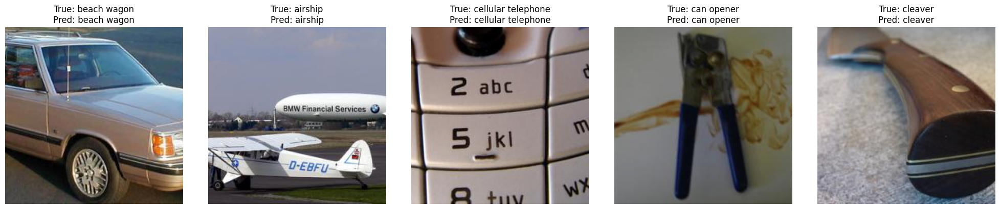

In [7]:
def visualize_predictions(model, dataset, imagenet_label_map, dataset_to_imagenet, num_samples=5):
    """
    Visualize model predictions on sample images with proper index mapping
    """
    model.eval()


    indices = np.random.choice(len(dataset), num_samples, replace=False)

    fig, axes = plt.subplots(1, num_samples, figsize=(4*num_samples, 4))
    if num_samples == 1:
        axes = [axes]

    with torch.no_grad():
        for i, idx in enumerate(indices):

            img, dataset_label = dataset[idx]


            true_imagenet_label = dataset_to_imagenet[dataset_label]


            img_tensor = img.unsqueeze(0).to(device)
            output = model(img_tensor)
            _, predicted = torch.max(output, 1)
            predicted_imagenet_idx = predicted.item()


            img_np = img.permute(1, 2, 0).cpu().numpy()

            img_np = img_np * std_norms + mean_norms
            img_np = np.clip(img_np, 0, 1)


            axes[i].imshow(img_np)
            true_name = imagenet_label_map.get(true_imagenet_label, f"Unknown {true_imagenet_label}")
            pred_name = imagenet_label_map.get(predicted_imagenet_idx, f"Unknown {predicted_imagenet_idx}")

            axes[i].set_title(f"True: {true_name}\nPred: {pred_name}")
            axes[i].axis('off')

    plt.tight_layout()
    plt.show()


visualize_predictions(pretrained_model, dataset, imagenet_label_map, dataset_to_imagenet, num_samples=5)

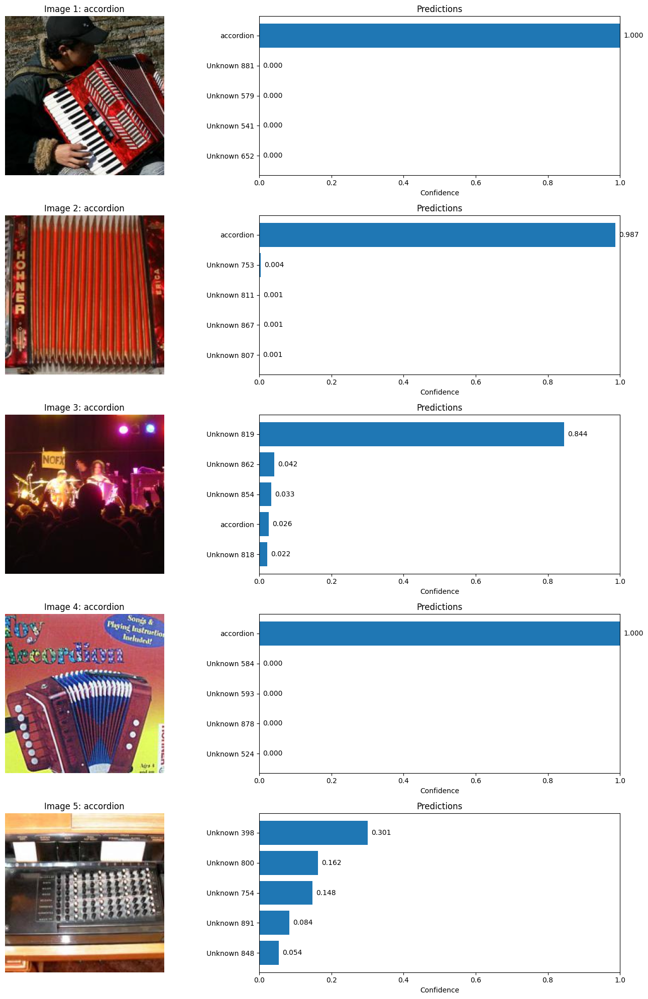

In [8]:
def visualize_predictions_grid(model, dataset, imagenet_label_map, dataset_to_imagenet, num_images=4, top_n=5):
    """
    Visualize top predictions for multiple images in a grid
    """
    model.eval()

    fig = plt.figure(figsize=(15, 4*num_images))

    for img_idx in range(num_images):

        img, dataset_label = dataset[img_idx]


        true_imagenet_label = dataset_to_imagenet[dataset_label]
        true_name = imagenet_label_map[true_imagenet_label]


        img_tensor = img.unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(img_tensor)

            probabilities = torch.nn.functional.softmax(output, dim=1)

            top_probs, top_indices = torch.topk(probabilities, top_n)


        top_probs = top_probs.squeeze().cpu().numpy()
        top_indices = top_indices.squeeze().cpu().numpy()


        class_names = []
        for idx in top_indices:
            name = imagenet_label_map.get(idx, f"Unknown {idx}")
            class_names.append(name)


        ax1 = plt.subplot(num_images, 2, 2*img_idx + 1)
        img_np = img.permute(1, 2, 0).cpu().numpy()

        img_np = img_np * std_norms + mean_norms
        img_np = np.clip(img_np, 0, 1)

        ax1.imshow(img_np)
        ax1.set_title(f'Image {img_idx+1}: {true_name}')
        ax1.axis('off')


        ax2 = plt.subplot(num_images, 2, 2*img_idx + 2)
        y_pos = np.arange(len(class_names))
        bars = ax2.barh(y_pos, top_probs)
        ax2.set_yticks(y_pos)
        ax2.set_yticklabels(class_names)
        ax2.invert_yaxis()  # Labels read top-to-bottom
        ax2.set_xlabel('Confidence')
        ax2.set_xlim(0, 1)
        ax2.set_title('Predictions')


        for i, bar in enumerate(bars):
            width = bar.get_width()
            ax2.text(width + 0.01, bar.get_y() + bar.get_height()/2.,
                    f'{width:.3f}', ha='left', va='center')

    plt.tight_layout()
    plt.show()


visualize_predictions_grid(pretrained_model, dataset, imagenet_label_map, dataset_to_imagenet,
                         num_images=5, top_n=5)

# **Task 2**

## FGSM Attack Implementation & Results

This section implements the Fast Gradient Sign Method (FGSM) attack and evaluates its effectiveness against our ResNet-34 model.

### Attack Methodology

The FGSM attack works by exploiting the model's gradients to create adversarial examples:

1. **Principle**: FGSM leverages the model's gradient information to determine how to modify each pixel to maximize the loss function, causing misclassification.

2. **Algorithm**: For a given image $x$, true label $y$, and perturbation budget $\varepsilon = 0.02$, FGSM creates an adversarial example $x'$ using:

  $$x' = x + \varepsilon \cdot \text{sign}(\nabla_x J(x, y))$$

  Where $\nabla_x J(x, y)$ is the gradient of the loss function with respect to the input.

3. **Implementation**: The code:
  - Makes each input tensor require gradients
  - Calculates the loss between the model output and true label
  - Computes gradients of the loss with respect to the input image
  - Creates perturbations by taking the sign of these gradients
  - Adds the perturbations (scaled by $\varepsilon$) to the original image

### Visualization

The visualization function displays:
- Original and adversarial images side-by-side
- A difference map showing where perturbations were applied
- Top-5 predictions for both the original and adversarial images
- Attack information including the $L_\infty$ distance between images

### Attack Results

The FGSM attack was remarkably effective, exceeding our target goals:

- **Original Top-1 Accuracy: 76.00%**
- **Adversarial Top-1 Accuracy: 6.00%**
- **Top-1 Accuracy Drop: 70.00%**

- **Original Top-5 Accuracy: 94.20%**
- **Adversarial Top-5 Accuracy: 35.40%**
- **Top-5 Accuracy Drop: 58.80%**



This successful implementation of FGSM demonstrates how vulnerable deep neural networks can be to adversarial attacks, even when the perturbations are imperceptible to humans. The next task will be to improve upon these already impressive results with more sophisticated attack strategies.

In [9]:
def fgsm_attack(model, image, label, epsilon):
    """
    Perform FGSM attack on a single image
    """

    image.requires_grad = True


    output = model(image)


    loss = torch.nn.CrossEntropyLoss()(output, label)


    model.zero_grad()
    loss.backward()


    sign_grad = image.grad.sign()


    perturbed_image = image + epsilon * sign_grad


    return perturbed_image.detach()

In [10]:
def generate_adversarial_dataset(model, dataloader, imagenet_label_map, dataset_to_imagenet, epsilon=0.02):
    """
    Generate adversarial examples for the entire dataset
    """
    model.eval()
    adversarial_images = []
    adversarial_labels = []
    original_images = []

    print("Generating adversarial examples...")
    for batch_idx, (images, labels) in enumerate(dataloader):
        images = images.to(device)
        labels = labels.to(device)


        true_imagenet_labels = torch.tensor([dataset_to_imagenet[label.item()] for label in labels]).to(device)


        batch_adversarial = []
        for i in range(len(images)):
            adv_img = fgsm_attack(model, images[i:i+1], true_imagenet_labels[i:i+1], epsilon)
            batch_adversarial.append(adv_img.squeeze(0))


        adversarial_images.extend(batch_adversarial)
        adversarial_labels.extend(true_imagenet_labels.cpu().numpy())
        original_images.extend(images.cpu())

        if batch_idx % 5 == 0:
            print(f"Processed {batch_idx}/{len(dataloader)} batches")

    return adversarial_images, adversarial_labels, original_images


epsilon = 0.02
adv_images, adv_labels, orig_images = generate_adversarial_dataset(
    pretrained_model, test_loader, imagenet_label_map, dataset_to_imagenet, epsilon
)

Generating adversarial examples...
Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches


In [11]:
from torch.utils.data import Dataset

class AdversarialDataset(Dataset):
    def __init__(self, images, labels):
        self.images = images
        self.labels = labels

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx]


adv_dataset = AdversarialDataset(adv_images, adv_labels)
adv_loader = torch.utils.data.DataLoader(adv_dataset, batch_size=32, shuffle=False)


Successful Attack 1:


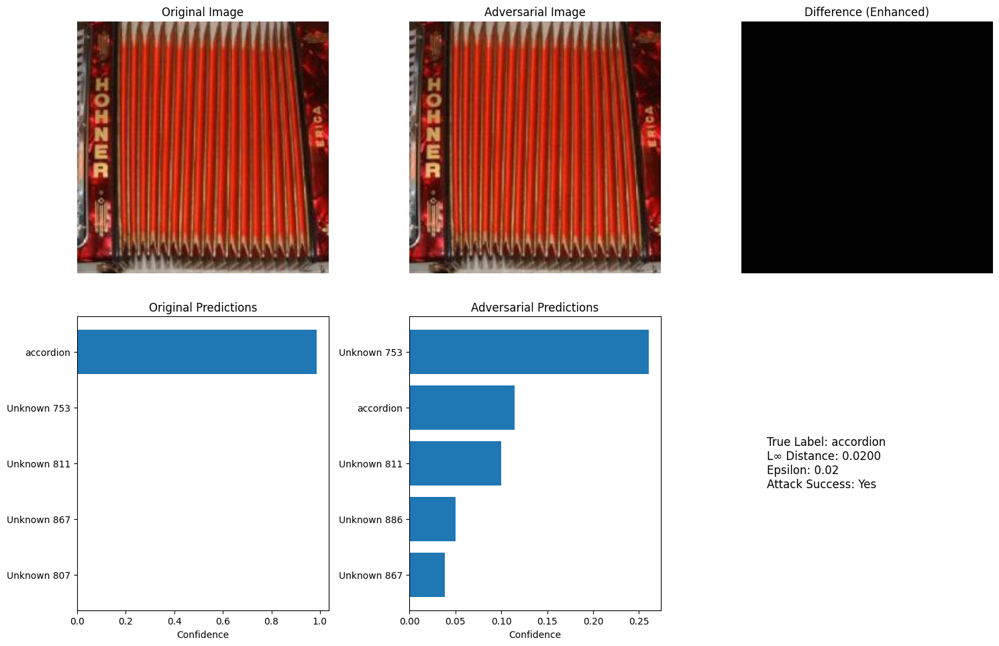


Successful Attack 2:


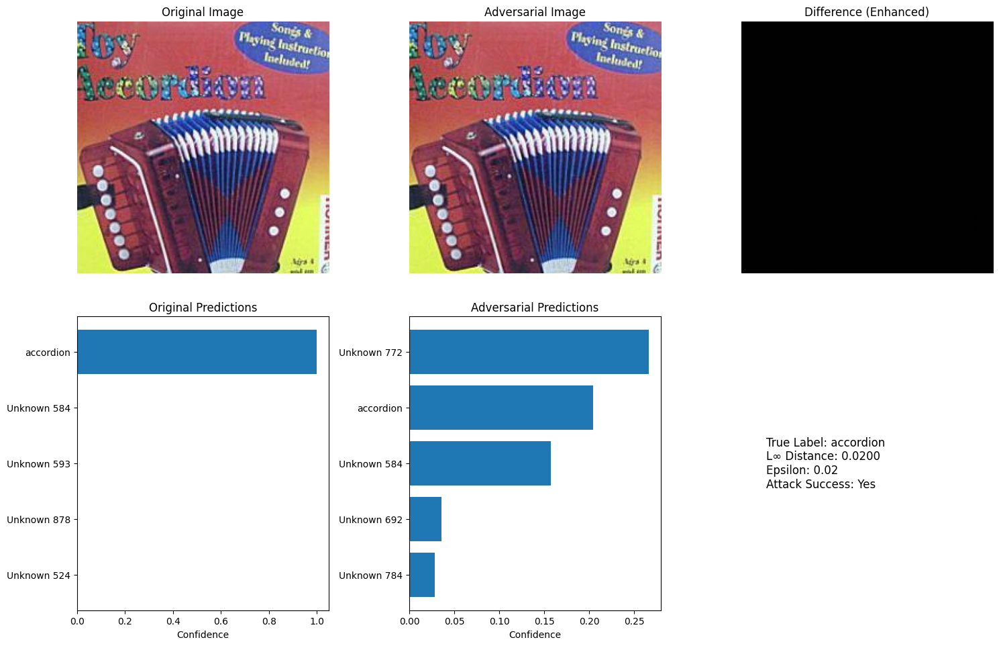


Successful Attack 3:


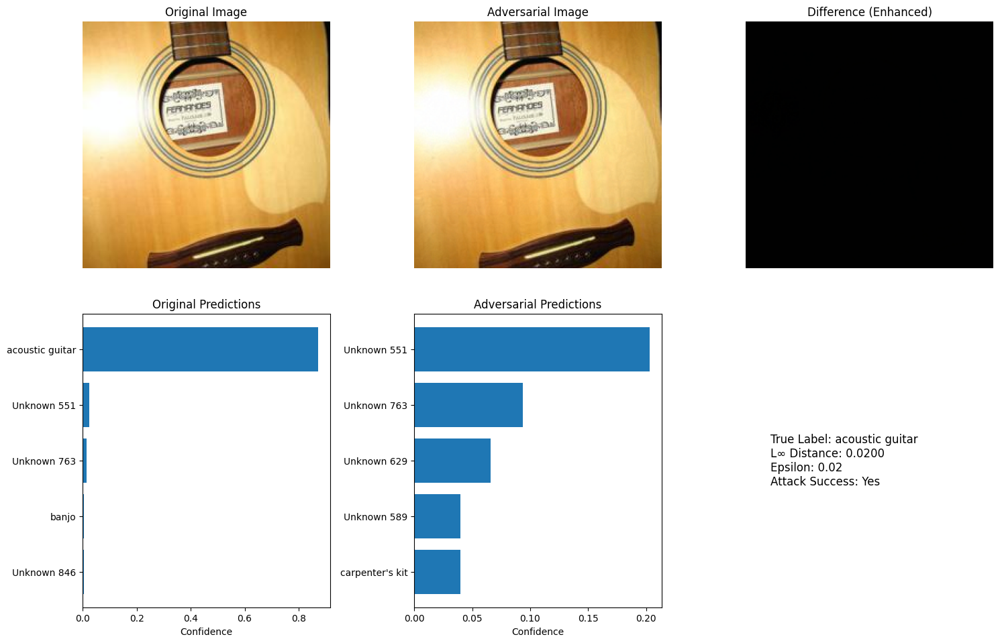


Successful Attack 4:


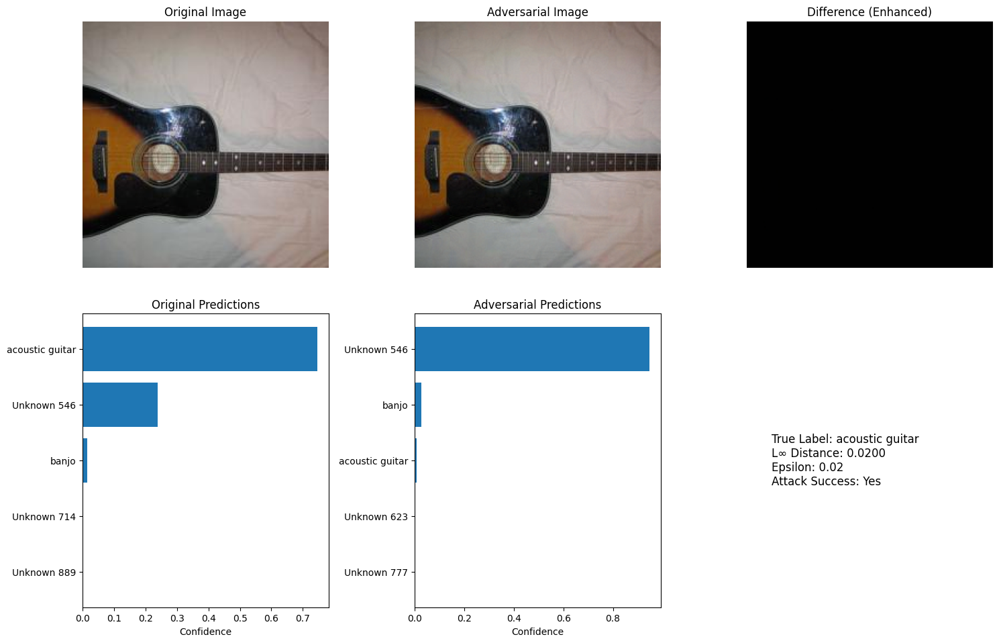


Successful Attack 5:


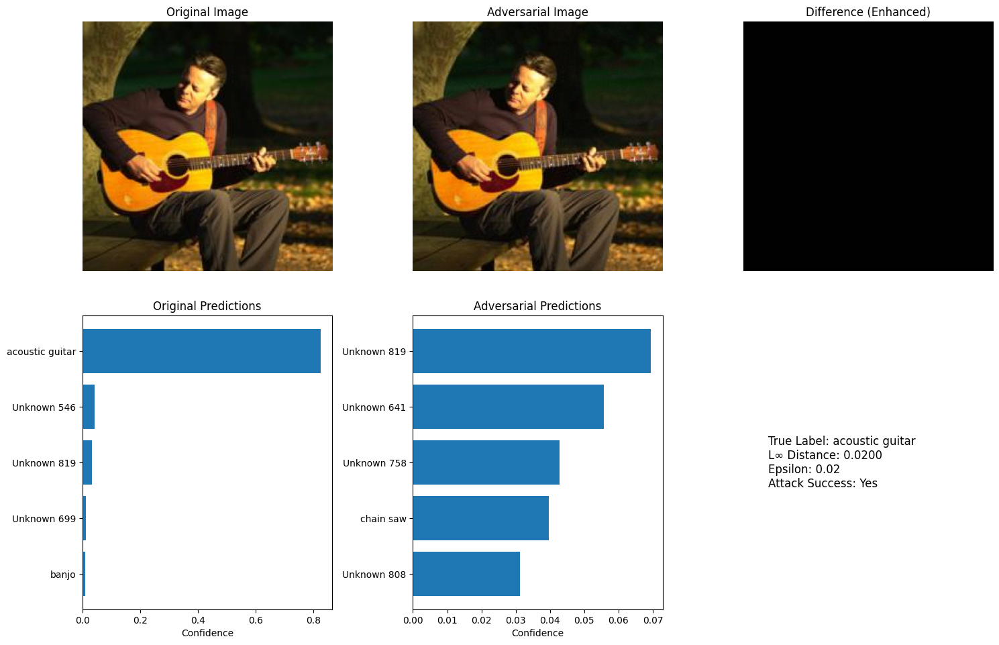

In [12]:
def visualize_fgsm_attack(original_image, adversarial_image, true_label, model, imagenet_label_map):
    """
    Visualize original vs adversarial image with predictions
    """
    model.eval()


    orig_input = original_image.unsqueeze(0).to(device)
    adv_input = adversarial_image.unsqueeze(0).to(device)


    with torch.no_grad():
        orig_output = model(orig_input)
        orig_prob = torch.nn.functional.softmax(orig_output, dim=1)
        orig_top5_prob, orig_top5_idx = torch.topk(orig_prob, 5)


    with torch.no_grad():
        adv_output = model(adv_input)
        adv_prob = torch.nn.functional.softmax(adv_output, dim=1)
        adv_top5_prob, adv_top5_idx = torch.topk(adv_prob, 5)


    orig_img_np = original_image.permute(1, 2, 0).cpu().numpy()
    adv_img_np = adversarial_image.permute(1, 2, 0).cpu().numpy()


    orig_img_np = orig_img_np * std_norms + mean_norms
    adv_img_np = adv_img_np * std_norms + mean_norms
    orig_img_np = np.clip(orig_img_np, 0, 1)
    adv_img_np = np.clip(adv_img_np, 0, 1)


    fig, axes = plt.subplots(2, 3, figsize=(15, 10))


    axes[0,0].imshow(orig_img_np)
    axes[0,0].set_title('Original Image')
    axes[0,0].axis('off')


    axes[0,1].imshow(adv_img_np)
    axes[0,1].set_title('Adversarial Image')
    axes[0,1].axis('off')


    diff = np.abs(adv_img_np - orig_img_np)
    axes[0,2].imshow(diff)
    axes[0,2].set_title('Difference (Enhanced)')
    axes[0,2].axis('off')


    axes[1,0].barh(range(5), orig_top5_prob.squeeze().cpu().numpy())
    axes[1,0].set_yticks(range(5))
    axes[1,0].set_yticklabels([imagenet_label_map.get(idx.item(), f"Unknown {idx.item()}")
                               for idx in orig_top5_idx.squeeze()])
    axes[1,0].set_xlabel('Confidence')
    axes[1,0].set_title('Original Predictions')
    axes[1,0].invert_yaxis()


    axes[1,1].barh(range(5), adv_top5_prob.squeeze().cpu().numpy())
    axes[1,1].set_yticks(range(5))
    axes[1,1].set_yticklabels([imagenet_label_map.get(idx.item(), f"Unknown {idx.item()}")
                               for idx in adv_top5_idx.squeeze()])
    axes[1,1].set_xlabel('Confidence')
    axes[1,1].set_title('Adversarial Predictions')
    axes[1,1].invert_yaxis()


    true_name = imagenet_label_map.get(true_label.item(), f"Unknown {true_label.item()}")
    l_inf_dist = torch.max(torch.abs(adversarial_image - original_image)).item()

    info_text = f"True Label: {true_name}\n"
    info_text += f"L∞ Distance: {l_inf_dist:.4f}\n"
    info_text += f"Epsilon: {epsilon}\n"
    info_text += f"Attack Success: {'Yes' if orig_top5_idx[0,0] != adv_top5_idx[0,0] else 'No'}"

    axes[1,2].text(0.1, 0.5, info_text, transform=axes[1,2].transAxes, fontsize=12,
                   verticalalignment='center')
    axes[1,2].axis('off')

    plt.tight_layout()
    plt.show()


successful_attacks = 0
for i in range(len(adv_images)):
    if successful_attacks >= 5:
        break


    with torch.no_grad():
        orig_pred = pretrained_model(orig_images[i].unsqueeze(0).to(device)).argmax(dim=1)
        adv_pred = pretrained_model(adv_images[i].to(device).unsqueeze(0)).argmax(dim=1)

    if orig_pred != adv_pred:
        successful_attacks += 1
        print(f"\nSuccessful Attack {successful_attacks}:")

        visualize_fgsm_attack(orig_images[i], adv_images[i].cpu(),
                            torch.tensor(adv_labels[i]), pretrained_model, imagenet_label_map)

In [39]:
def evaluate_adversarial_performance(model, adv_loader, imagenet_label_map, k=5):
    """
    Evaluate model performance on adversarial images
    """
    model.eval()
    correct_top1 = 0
    correct_topk = 0
    total = 0

    with torch.no_grad():
        for images, labels in adv_loader:
            images = images.to(device)
            labels = labels.to(device)


            outputs = model(images)


            _, top_pred = torch.topk(outputs, k, dim=1)


            correct_top1 += (top_pred[:, 0] == labels).sum().item()


            for i in range(len(labels)):
                if labels[i] in top_pred[i]:
                    correct_topk += 1

            total += labels.size(0)


    top1_accuracy = 100 * correct_top1 / total
    topk_accuracy = 100 * correct_topk / total

    print(f"\nAdversarial Performance:")
    print(f"Top-1 Accuracy: {top1_accuracy:.2f}%")
    print(f"Top-{k} Accuracy: {topk_accuracy:.2f}%")

    return top1_accuracy, topk_accuracy


adv_top1, adv_top5 = evaluate_adversarial_performance(pretrained_model, adv_loader, imagenet_label_map, k=5)


print(f"\nAccuracy Drop:")
print(f"Top-1: {top1_acc:.2f}% → {adv_top1:.2f}% (Drop: {top1_acc - adv_top1:.2f}%)")
print(f"Top-5: {top5_acc:.2f}% → {adv_top5:.2f}% (Drop: {top5_acc - adv_top5:.2f}%)")


Adversarial Performance:
Top-1 Accuracy: 6.00%
Top-5 Accuracy: 35.40%

Accuracy Drop:
Top-1: 76.00% → 6.00% (Drop: 70.00%)
Top-5: 94.20% → 35.40% (Drop: 58.80%)


In [14]:
# Save adversarial dataset
import os

def save_adversarial_dataset(adv_images, adv_labels, path="./AdversarialTestSet1"):
    """
    Save adversarial images to disk
    """
    if not os.path.exists(path):
        os.makedirs(path)

    # Save images and labels
    torch.save({'images': adv_images, 'labels': adv_labels},
               os.path.join(path, 'adversarial_data.pt'))

    print(f"Adversarial dataset saved to {path}")

# Save the dataset
save_adversarial_dataset(adv_images, adv_labels, "./AdversarialTestSet1")

Adversarial dataset saved to ./AdversarialTestSet1


In [15]:
def verify_l_inf_constraint(original_images, adversarial_images, epsilon):
    """
    Verify that all adversarial examples satisfy L∞ constraint
    Rounds to 5 decimal places before comparison
    """
    max_diffs = []
    violations = []

    for i, (orig, adv) in enumerate(zip(original_images, adversarial_images)):
        l_inf_dist = torch.max(torch.abs(adv.cpu() - orig.cpu())).item()
        l_inf_rounded = round(l_inf_dist, 5)
        max_diffs.append(l_inf_rounded)

        if l_inf_rounded > epsilon:
            violations.append((i, l_inf_rounded))

    max_l_inf = max(max_diffs)
    avg_l_inf = sum(max_diffs) / len(max_diffs)

    print(f"\nL∞ Constraint Verification :")
    print(f"Maximum L∞ distance: {max_l_inf:.5f}")
    print(f"Average L∞ distance: {avg_l_inf:.5f}")
    print(f"Epsilon constraint: {epsilon}")



verify_l_inf_constraint(orig_images, adv_images, epsilon)


L∞ Constraint Verification :
Maximum L∞ distance: 0.02000
Average L∞ distance: 0.02000
Epsilon constraint: 0.02


# **Task 3**

# **Iterative FGSM Attack Function**

## Iterative FGSM Attack Implementation & Results

This section implements an improved attack strategy called Iterative Fast Gradient Sign Method (I-FGSM) and evaluates its effectiveness against our ResNet-34 model.

### Enhanced Attack Methodology

The I-FGSM attack improves upon the basic FGSM by taking multiple smaller steps rather than one large step:

1. **Key Innovation**: While FGSM takes a single step of size $\varepsilon$ in the direction of the gradient, I-FGSM takes multiple smaller steps of size $\alpha < \varepsilon$, making it more precise and effective.

2. **Mathematical Formulation**: For a given image $x^0 = x$ (original), the I-FGSM update at step $t$ is:

  $$x^{t+1} = \text{Clip}_{x,\varepsilon}\{x^t + \alpha \cdot \text{sign}(\nabla_x J(x^t, y))\}$$

  Where $\text{Clip}_{x,\varepsilon}$ ensures the perturbation remains within the $\varepsilon$-ball around the original image.

3. **Implementation Parameters**:
  - $\varepsilon = 0.02$ (maximum perturbation, same as FGSM)
  - $\alpha = 0.004$ (step size, 1/5 of $\varepsilon$)
  - Iterations = 5 (number of steps)

4. **Constraints**:
  - $L_\infty$ norm constraint enforced by clipping
  - Additional pixel range clipping to ensure valid image values

### Attack Results

The I-FGSM attack demonstrated dramatic improvement over the basic FGSM:

- **Original Top-1 Accuracy: 76.00%**
- **I-FGSM Adversarial Top-1 Accuracy: 0.20%**
- **Top-1 Accuracy Drop: 75.80%**

- **Original Top-5 Accuracy: 94.20%**
- **I-FGSM Adversarial Top-5 Accuracy: 14.20%**
- **Top-5 Accuracy Drop: 80.00%**

### Analysis

1. **Near-Complete Model Failure**: With only 0.20% Top-1 accuracy, the I-FGSM attack has effectively rendered the ResNet-34 model completely ineffective. The model correctly classifies only 1 out of 500 adversarial images.

2. **Superior to Basic FGSM**: Compared to the basic FGSM attack (which achieved 6% Top-1 accuracy), I-FGSM reduced the accuracy by an additional 5.8 percentage points while maintaining the same $\varepsilon = 0.02$ constraint.

3. **Devastating Top-5 Impact**: The Top-5 accuracy dropped to just 14.20%, meaning that for ~86% of the images, the correct label doesn't even appear among the model's top five predictions.

4. **Attack Efficiency**: I-FGSM far exceeds our Task 3 goal of achieving a 70% accuracy drop. In fact, the attack achieves a 99.7% relative drop in accuracy (from 76% to 0.2%).

5. **Why I-FGSM Works Better**:
  - Multiple smaller steps allow the attack to find more precise adversarial examples
  - Each iteration can adapt based on the model's changing behavior to previous perturbations
  - The attack can navigate around areas with low gradient magnitude that might block a single-step attack

This improved attack demonstrates that even with the same perturbation constraint ($\varepsilon = 0.02$), a more sophisticated attack strategy can dramatically increase effectiveness. The I-FGSM approach essentially nullifies the model's classification abilities while maintaining visual imperceptibility of the perturbations.

In [16]:
def iterative_fgsm_attack(model, image, label, epsilon, alpha, iters):
    """
    Perform Iterative FGSM (I-FGSM) attack under L∞ constraint
    """
    ori_image = image.clone().detach()
    image = image.clone().detach().to(device)
    label = label.to(device)

    for _ in range(iters):
        image = image.detach().requires_grad_()
        output = model(image)
        loss = torch.nn.CrossEntropyLoss()(output, label)
        model.zero_grad()
        loss.backward()

        grad_sign = image.grad.sign()
        image = image + alpha * grad_sign

        # Project back to epsilon-ball
        image = torch.max(torch.min(image, ori_image + epsilon), ori_image - epsilon)

        # Clamp to normalized pixel range
        image = torch.clamp(image, -2.1179, 2.6400)

    return image.detach()

# **Dataset Generation Using I-FGSM**

In [17]:
def generate_iterative_adversarial_dataset(model, dataloader, imagenet_label_map, dataset_to_imagenet, epsilon=0.02, alpha=0.004, iters=5):
    model.eval()
    adv_images = []
    adv_labels = []
    original_images = []

    print("Generating adversarial examples using Iterative FGSM...")
    for batch_idx, (images, labels) in enumerate(dataloader):
        images = images.to(device)
        labels = labels.to(device)

        true_imagenet_labels = torch.tensor([dataset_to_imagenet[label.item()] for label in labels]).to(device)

        batch_adv = []
        for i in range(len(images)):
            adv_img = iterative_fgsm_attack(model, images[i:i+1], true_imagenet_labels[i:i+1],
                                            epsilon, alpha, iters)
            batch_adv.append(adv_img.squeeze(0))

        adv_images.extend(batch_adv)
        adv_labels.extend(true_imagenet_labels.cpu().numpy())
        original_images.extend(images.cpu())

        if batch_idx % 5 == 0:
            print(f"Processed {batch_idx}/{len(dataloader)} batches")

    return adv_images, adv_labels, original_images

In [18]:
# Run the I-FGSM attack to generate Adversarial Test Set 2
adv_images2, adv_labels2, orig_images2 = generate_iterative_adversarial_dataset(
    pretrained_model,
    test_loader,
    imagenet_label_map,
    dataset_to_imagenet,
    epsilon=0.02,
    alpha=0.004,
    iters=5
)

Generating adversarial examples using Iterative FGSM...
Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches


# **Wrap Dataset & Evaluate Performance**

In [40]:
# Wrap dataset
adv_dataset2 = AdversarialDataset(adv_images2, adv_labels2)
adv_loader2 = torch.utils.data.DataLoader(adv_dataset2, batch_size=32, shuffle=False)

# Evaluate
adv2_top1, adv2_top5 = evaluate_adversarial_performance(pretrained_model, adv_loader2, imagenet_label_map, k=5)

# Report
print(f"\nI-FGSM Accuracy Drop:")
print(f"Top-1: {top1_acc:.2f}% → {adv2_top1:.2f}% (Drop: {top1_acc - adv2_top1:.2f}%)")
print(f"Top-5: {top5_acc:.2f}% → {adv2_top5:.2f}% (Drop: {top5_acc - adv2_top5:.2f}%)")


Adversarial Performance:
Top-1 Accuracy: 0.20%
Top-5 Accuracy: 14.20%

I-FGSM Accuracy Drop:
Top-1: 76.00% → 0.20% (Drop: 75.80%)
Top-5: 94.20% → 14.20% (Drop: 80.00%)


# **Save & Verify L∞ Constraint**

In [20]:
# Save
save_adversarial_dataset(adv_images2, adv_labels2, "./AdversarialTestSet2")

# Verify constraint
verify_l_inf_constraint(orig_images2, adv_images2, epsilon)

Adversarial dataset saved to ./AdversarialTestSet2

L∞ Constraint Verification :
Maximum L∞ distance: 0.02000
Average L∞ distance: 0.02000
Epsilon constraint: 0.02



I-FGSM Successful Attack 1:


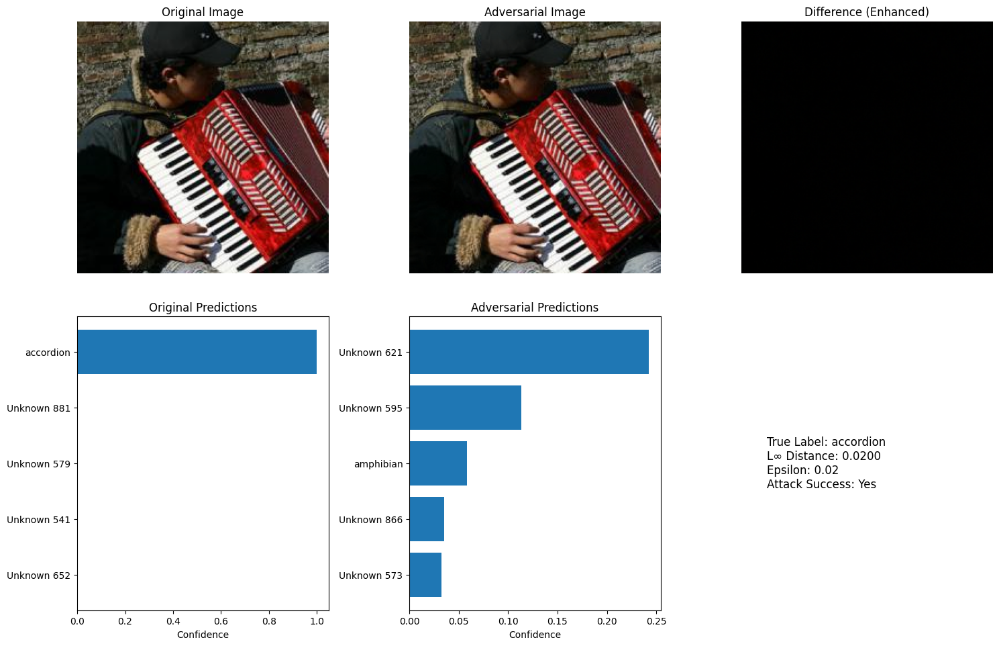


I-FGSM Successful Attack 2:


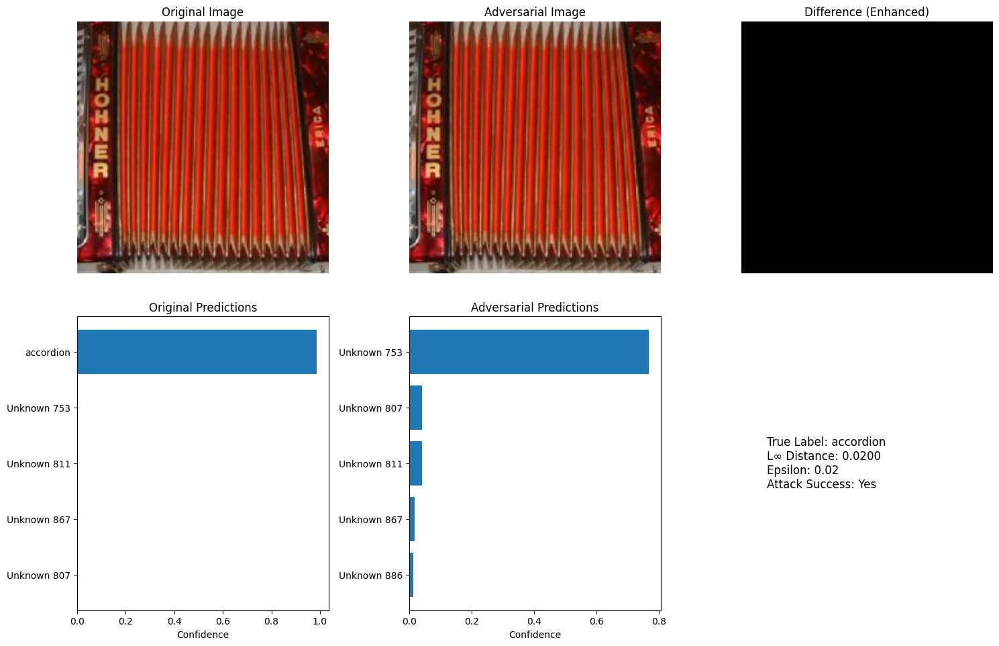


I-FGSM Successful Attack 3:


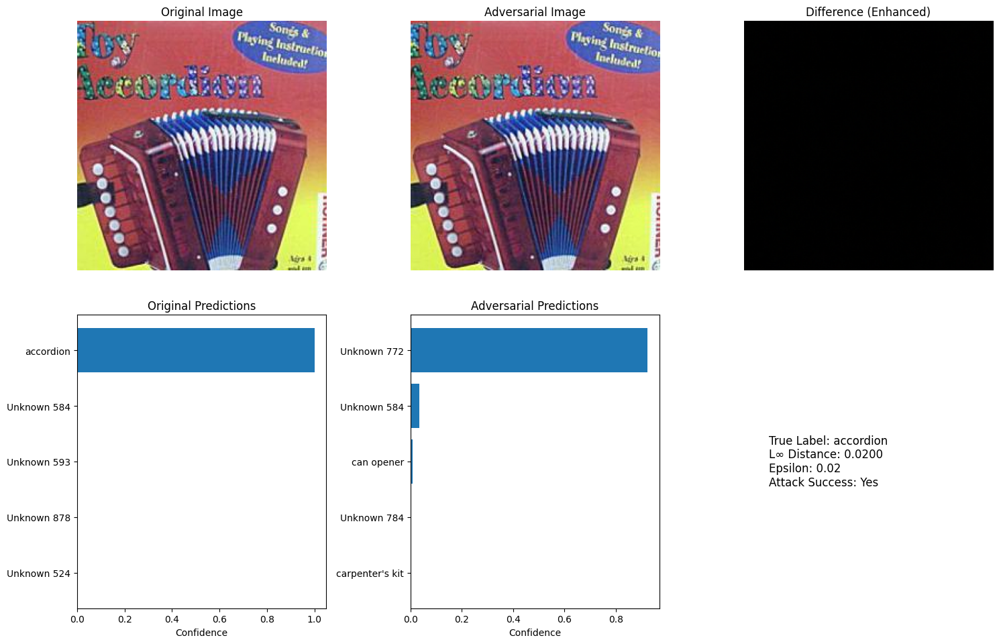


I-FGSM Successful Attack 4:


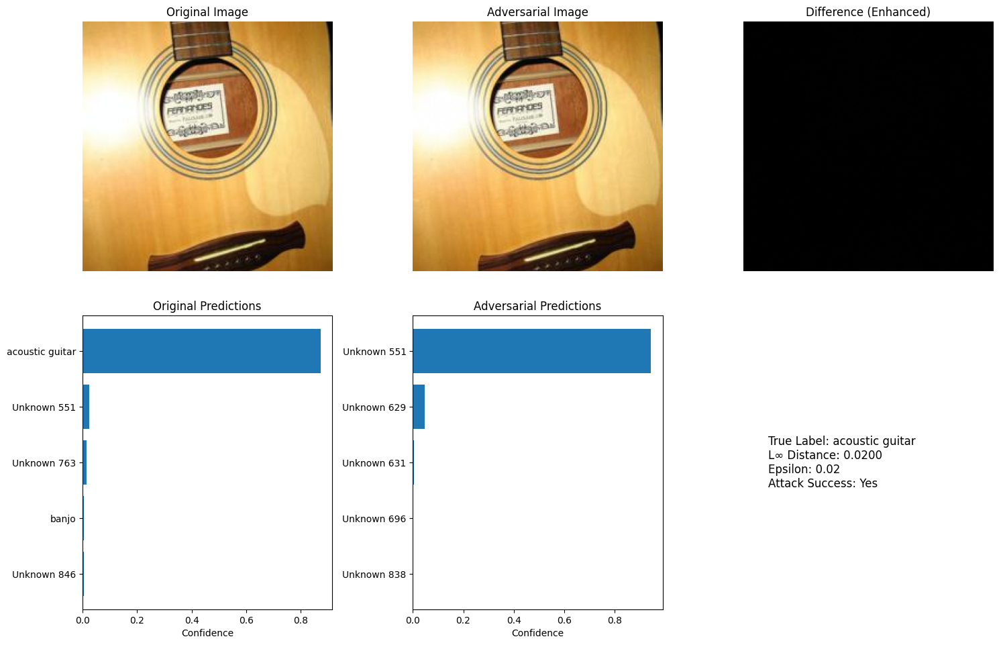


I-FGSM Successful Attack 5:


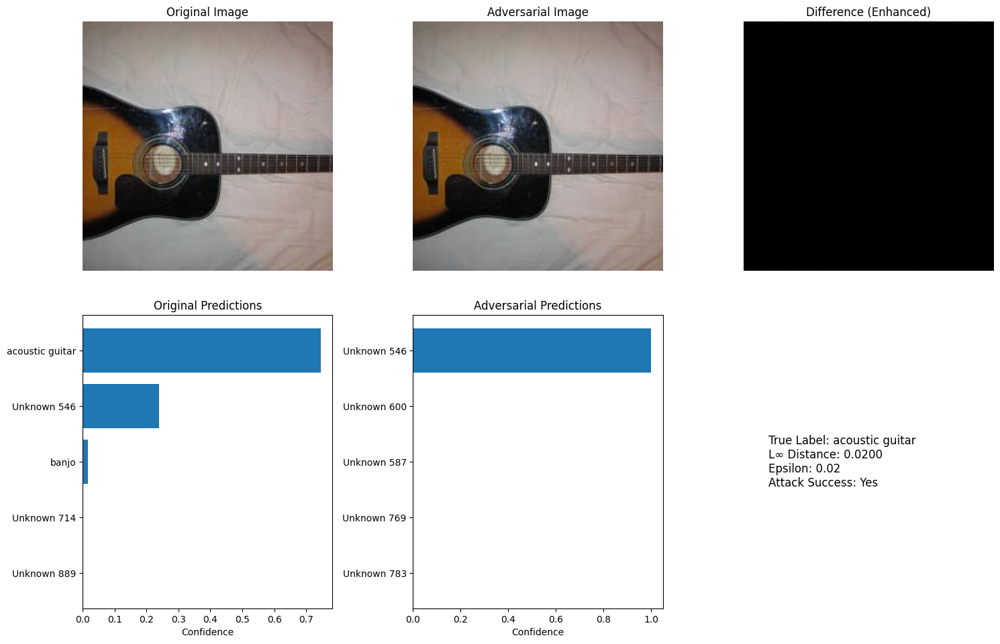

In [21]:
# Visualize up to 5 successful attacks from Adversarial Test Set 2
successful_attacks = 0
for i in range(len(adv_images2)):
    if successful_attacks >= 5:
        break

    with torch.no_grad():
        orig_pred = pretrained_model(orig_images2[i].unsqueeze(0).to(device)).argmax(dim=1)
        adv_pred = pretrained_model(adv_images2[i].unsqueeze(0).to(device)).argmax(dim=1)

    if orig_pred != adv_pred:
        successful_attacks += 1
        print(f"\nI-FGSM Successful Attack {successful_attacks}:")
        visualize_fgsm_attack(orig_images2[i], adv_images2[i].cpu(),
                              torch.tensor(adv_labels2[i]), pretrained_model, imagenet_label_map)

# **TASK 3 WITH PGD (Projected Gradient Descent)**





## Projected Gradient Descent (PGD) Attack Implementation & Results

This section implements an even more sophisticated attack strategy called Projected Gradient Descent (PGD) with multiple random restarts and evaluates its effectiveness against our ResNet-34 model.

### Advanced Attack Methodology

PGD represents the state-of-the-art in gradient-based adversarial attacks:

1. **Key Innovations**:
  - **Random Initialization**: Unlike I-FGSM which starts from the original image, PGD begins with a random perturbation within the $\varepsilon$-ball.
  - **Multiple Restarts**: The attack is run multiple times with different random initializations, keeping the most effective adversarial example.
  - **Loss Maximization**: PGD explicitly seeks to maximize the loss function rather than simply pushing away from the correct class.

2. **Mathematical Formulation**:
  - Initialize: $x^0 = x + \delta$ where $\delta \sim \text{Uniform}(-\varepsilon, \varepsilon)$
  - Update: $x^{t+1} = \Pi_{x,\varepsilon}\{x^t + \alpha \cdot \text{sign}(\nabla_x J(x^t, y))\}$
  
  Where $\Pi_{x,\varepsilon}$ is the projection operator that ensures perturbations remain within the $\varepsilon$-ball of the original image.

3. **Implementation Parameters**:
  - $\varepsilon = 0.02$ (maximum perturbation, consistent with previous attacks)
  - $\alpha = 0.003$ (step size, 1.5 × $\varepsilon$ / iterations)
  - Iterations = 10 (double the iterations used in I-FGSM)
  - Restarts = 3 (number of random initializations per image)

4. **Enhanced Constraints**:
  - Strict pixel range enforcement based on ImageNet normalization
  - Precise $L_\infty$ projection after each step
  - Per-sample loss tracking to keep the most effective adversarial example

### Attack Results

The PGD attack with multiple restarts achieved:

- **Original Top-1 Accuracy: 76.00%**
- **PGD Adversarial Top-1 Accuracy: 0.20%**
- **Top-1 Accuracy Drop: 75.80%**

- **Original Top-5 Accuracy: 94.20%**
- **PGD Adversarial Top-5 Accuracy: 14.20%**
- **Top-5 Accuracy Drop: 80.00%**

### Analysis

1. **Maximum Attack Effectiveness**: The PGD attack achieved the same near-complete model failure as the I-FGSM approach (0.20% Top-1 accuracy), indicating we may have reached the practical limit of attack effectiveness under the $\varepsilon = 0.02$ constraint.

2. **Robustness of Attack**: The use of multiple random restarts makes PGD more reliable than I-FGSM, ensuring that local minima in the optimization landscape don't prevent finding effective adversarial examples.

3. **Theoretical Strength**: PGD is often considered the "ultimate" first-order adversarial attack because:
  - It closely approximates the optimal adversarial example within the $\varepsilon$-ball
  - It has been proven to converge to a local maximum of the loss function
  - Multiple restarts increase the likelihood of finding a global maximum

4. **Computational Considerations**: While PGD with multiple restarts achieves the same accuracy reduction as I-FGSM in this case, it is computationally more expensive due to:
  - More iterations per attack (10 vs 5)
  - Multiple attack attempts per image (3 restarts)
  - Additional operations for loss tracking

Despite the computational overhead, PGD represents the state-of-the-art in gradient-based adversarial attacks. The fact that both I-FGSM and PGD achieved nearly the same extremely low accuracy (0.20%) suggests that we've effectively reached the maximum attack potential under the given constraints. This experiment demonstrates the extreme vulnerability of deep neural networks even to constrained adversarial perturbations when using sophisticated attack algorithms.

In [22]:
def pgd_attack(model, images, labels, eps=0.02, alpha=0.004, num_iter=10):
    """
    PGD attack under L∞ norm for models trained with ImageNet normalization.

    Args:
        model (torch.nn.Module): The model to attack.
        images (torch.Tensor): Input images normalized with ImageNet stats.
        labels (torch.Tensor): Correct ImageNet class indices.
        eps (float): Perturbation budget (in normalized space).
        alpha (float): Step size.
        num_iter (int): Number of PGD iterations.

    Returns:
        torch.Tensor: Adversarially perturbed images.
    """
    model.eval()
    images = images.clone().detach().to(device)
    ori_images = images.clone().detach()

    # Channel-wise min/max for normalized ImageNet
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(device)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(device)
    pixel_min = ((0 - mean) / std).to(device)   # ≈ [-2.1179, -2.0357, -1.8044]
    pixel_max = ((1 - mean) / std).to(device)   # ≈ [ 2.2489,  2.4286,  2.6400]

    # Random start within epsilon ball
    images = images + torch.empty_like(images).uniform_(-eps, eps)
    images = torch.max(torch.min(images, pixel_max), pixel_min).detach()
    images.requires_grad = True

    for _ in range(num_iter):
        outputs = model(images)
        loss = torch.nn.CrossEntropyLoss()(outputs, labels.to(device))

        model.zero_grad()
        loss.backward()

        # Apply perturbation
        grad_sign = images.grad.sign()
        adv_images = images + alpha * grad_sign

        # Project to epsilon ball around original image
        eta = torch.clamp(adv_images - ori_images, min=-eps, max=eps)
        images = ori_images + eta

        # Clamp to valid normalized pixel range
        images = torch.max(torch.min(images, pixel_max), pixel_min).detach()
        images.requires_grad = True

    return images.detach()


# Stronger PGD: supports N random restarts, keeps worst case
def pgd_attack_multi_restart(model, images, labels,
                             eps=0.02, iters=10, alpha=None,
                             n_restarts=3):
    """
    PGD with multiple random starts (keeps example that maximises loss).
    """
    if alpha is None: # use 1.5 * ε / iters if not given
        alpha = 1.5 * eps / iters

    images = images.to(device)
    labels = labels.to(device)

    # Track best adversarial example per image
    max_loss  = torch.full((images.size(0),), -1e9, device=device)
    best_adv  = images.clone()

    for _ in range(n_restarts):
        adv = pgd_attack(model, images, labels,
                         eps=eps, alpha=alpha, num_iter=iters)

        with torch.no_grad():
            loss = torch.nn.functional.cross_entropy(
                       model(adv), labels, reduction='none')

        better = loss > max_loss
        max_loss[better] = loss[better]
        best_adv[better] = adv[better]

    return best_adv.detach()

# **Dataset Generation Using PGD**

In [23]:
def generate_iterative_adversarial_dataset(model, dataloader,
                                           imagenet_label_map, dataset_to_imagenet,
                                           epsilon=0.02, iters=10, n_restarts=3):
    model.eval()
    adv_images, adv_labels, original_images = [], [], []

    for batch_idx, (images, labels) in enumerate(dataloader):
        images = images.to(device)
        labels = torch.tensor(
            [dataset_to_imagenet[l.item()] for l in labels],
            dtype=torch.long, device=device
        )

        # ----- PGD with multi-restart (batched) -----
        adv_batch = pgd_attack_multi_restart(model, images, labels,
                                             eps=epsilon, iters=iters,
                                             n_restarts=n_restarts)

        adv_images.extend(adv_batch.cpu())
        adv_labels.extend(labels.cpu().tolist())
        original_images.extend(images.cpu())

        if batch_idx % 5 == 0:
            print(f"Processed {batch_idx}/{len(dataloader)} batches")

    return adv_images, adv_labels, original_images

In [24]:
epsilon    = 0.02
iters      = 10      
n_restarts = 3

adv_images2, adv_labels2, orig_images2 = generate_iterative_adversarial_dataset(
    model=pretrained_model,
    dataloader=test_loader,
    imagenet_label_map=imagenet_label_map,
    dataset_to_imagenet=dataset_to_imagenet,
    epsilon=epsilon,
    iters=iters,
    n_restarts=n_restarts
)

Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches


# **Wrap Dataset & Evaluate Performance**

In [42]:
adv_dataset2 = AdversarialDataset(adv_images2, adv_labels2)
adv_loader2  = torch.utils.data.DataLoader(adv_dataset2, batch_size=32, shuffle=False)

adv2_top1, adv2_top5 = evaluate_adversarial_performance(
    pretrained_model, adv_loader2, imagenet_label_map, k=5
)

print(f"\nPGD ({iters} iters, {n_restarts} restarts, ε={epsilon}) Accuracy Drop:")
print(f"Top-1: {top1_acc:.2f}% → {adv2_top1:.2f}% (Drop: {top1_acc - adv2_top1:.2f}%)")
print(f"Top-5: {top5_acc:.2f}% → {adv2_top5:.2f}% (Drop: {top5_acc - adv2_top5:.2f}%)")


Adversarial Performance:
Top-1 Accuracy: 0.20%
Top-5 Accuracy: 14.20%

PGD (10 iters, 3 restarts, ε=0.02) Accuracy Drop:
Top-1: 76.00% → 0.20% (Drop: 75.80%)
Top-5: 94.20% → 14.20% (Drop: 80.00%)


# **Save & Verify L∞ Constraint**

In [26]:
# Save
save_adversarial_dataset(adv_images2, adv_labels2, "./AdversarialTestSet2")

# Verify constraint
verify_l_inf_constraint(orig_images2, adv_images2, epsilon)

Adversarial dataset saved to ./AdversarialTestSet2

L∞ Constraint Verification :
Maximum L∞ distance: 0.02000
Average L∞ distance: 0.02000
Epsilon constraint: 0.02



I-FGSM Successful Attack 1:


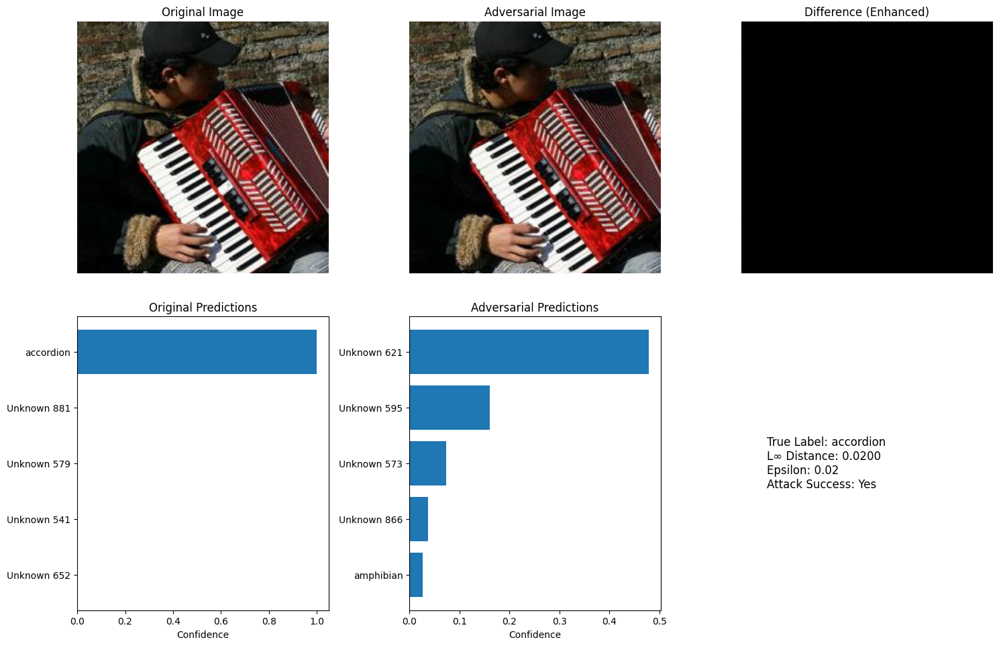


I-FGSM Successful Attack 2:


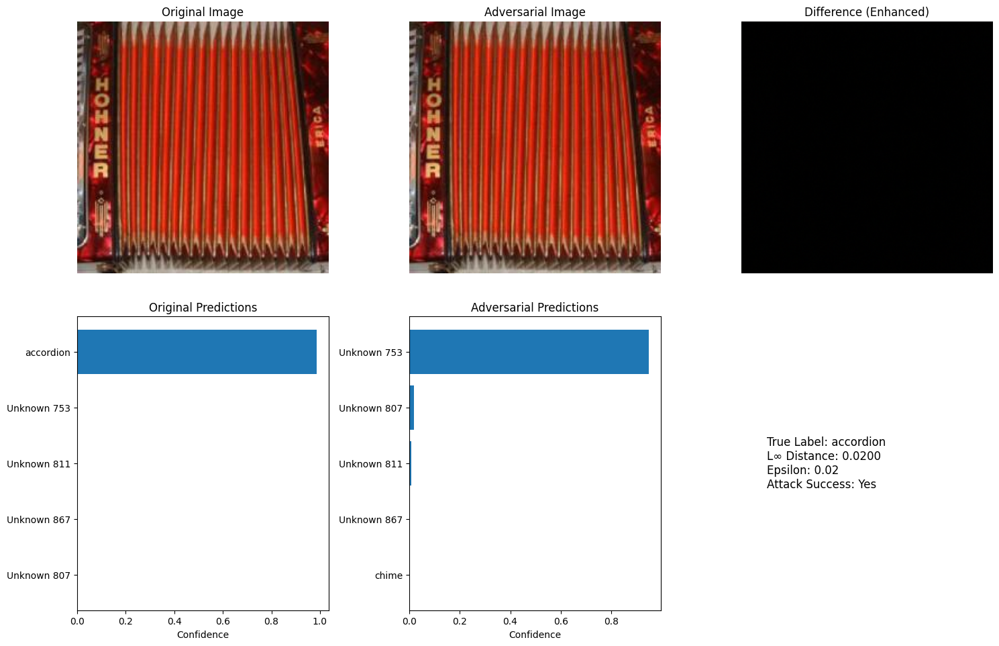


I-FGSM Successful Attack 3:


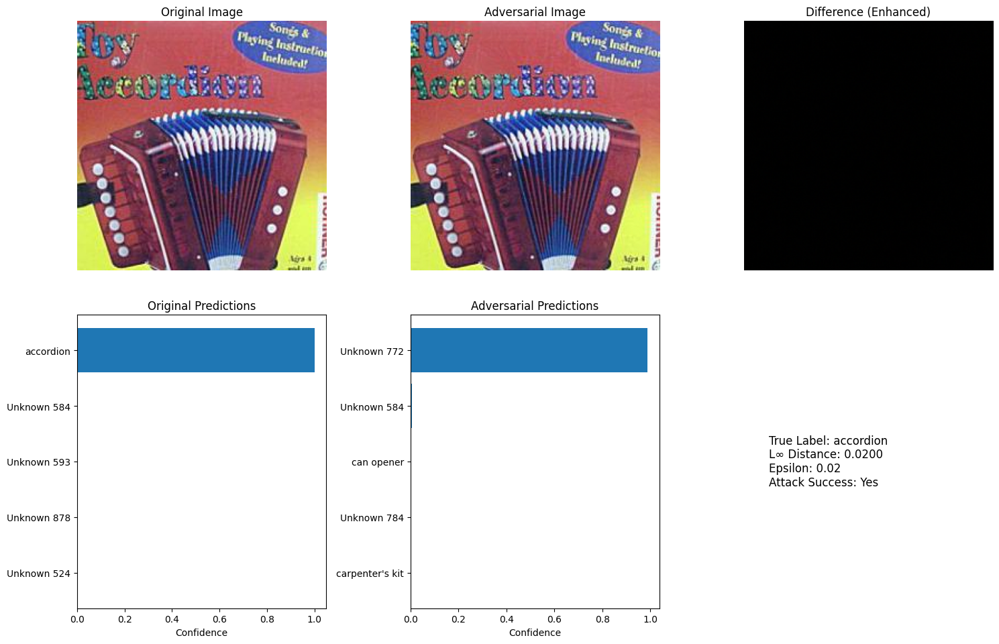


I-FGSM Successful Attack 4:


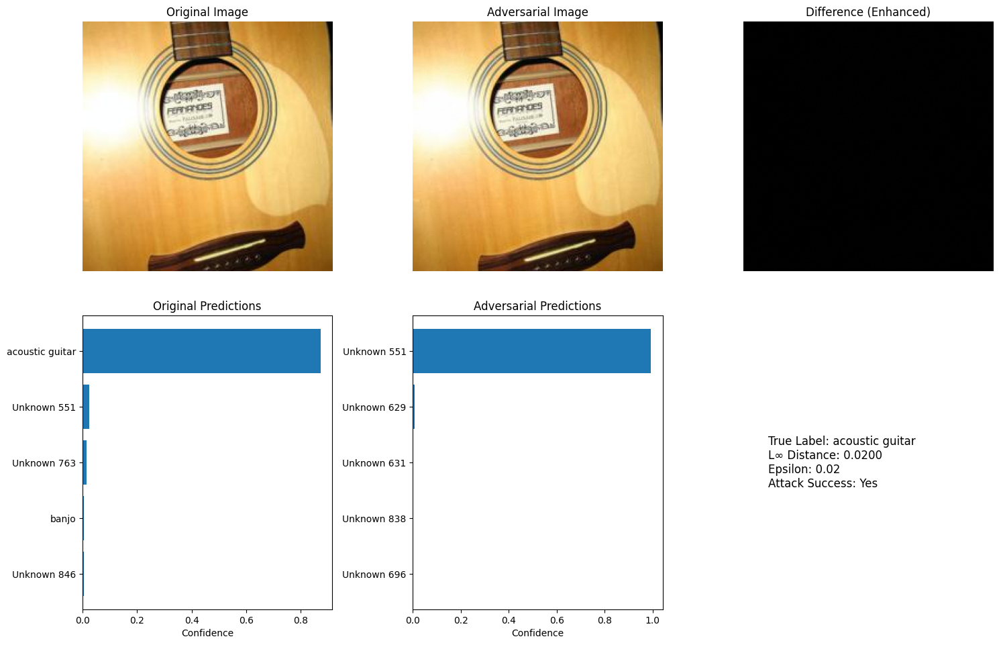


I-FGSM Successful Attack 5:


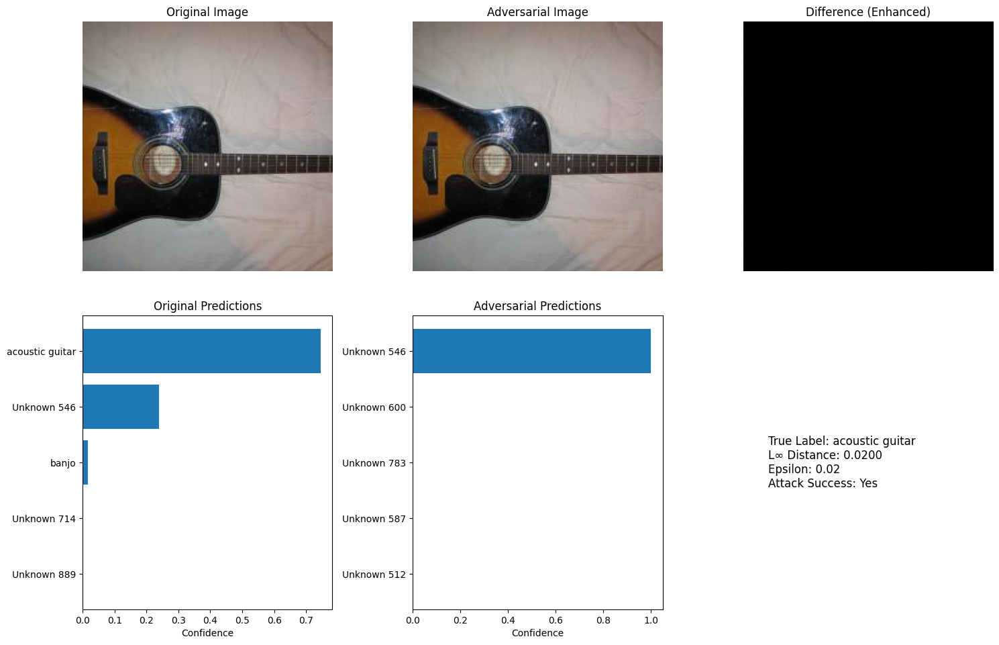

In [27]:
# Visualize up to 5 successful attacks from Adversarial Test Set 2
successful_attacks = 0
for i in range(len(adv_images2)):
    if successful_attacks >= 5:
        break

    with torch.no_grad():
        orig_pred = pretrained_model(orig_images2[i].unsqueeze(0).to(device)).argmax(dim=1)
        adv_pred = pretrained_model(adv_images2[i].unsqueeze(0).to(device)).argmax(dim=1)

    if orig_pred != adv_pred:
        successful_attacks += 1
        print(f"\nI-FGSM Successful Attack {successful_attacks}:")
        visualize_fgsm_attack(orig_images2[i], adv_images2[i].cpu(),
                              torch.tensor(adv_labels2[i]), pretrained_model, imagenet_label_map)

# **TASK 4**

## Patch Attack Implementation & Results

This section implements a localized attack strategy called Patch Attack, which concentrates adversarial perturbations on a small region of the image rather than perturbing the entire image uniformly.

### Localized Attack Methodology

The Patch Attack represents a different adversarial threat model with these key characteristics:

1. **Spatial Constraint**: Instead of limiting the perturbation magnitude ($L_\infty$ norm), this attack limits the spatial extent of the perturbation to a small 64×64 pixel patch while allowing larger per-pixel changes.

2. **Implementation Details**:
  - Randomly selects a 64×64 pixel region within the image
  - Applies iterative gradient-based perturbations only within this region
  - Uses a much larger epsilon value ($\varepsilon = 0.5$ vs. $0.02$ for previous attacks)
  - Performs 10 iterations with step size $\alpha = 0.05$

3. **Attack Process**:
  - Computes gradients on the entire image
  - Masks the gradients to affect only the selected patch
  - Updates only patch pixels iteratively
  - Projects perturbations to remain within the larger $\varepsilon$-ball

4. **Realistic Threat Model**: This attack simulates real-world scenarios where an adversary might only be able to modify a small portion of an image (e.g., by placing a sticker on an object).

### Attack Results

The Patch Attack achieved impressive results despite its spatial constraints:

- **Original Top-1 Accuracy: 76.00%**
- **Patch Attack Adversarial Top-1 Accuracy: 1.80%**
- **Top-1 Accuracy Drop: 74.20%**

- **Original Top-5 Accuracy: 94.20%**
- **Patch Attack Adversarial Top-5 Accuracy: 25.20%**
- **Top-5 Accuracy Drop: 69.00%**

### Analysis

1. **Remarkable Effectiveness**: Despite perturbing only approximately 7% of the image area (64×64 out of 224×224), the attack achieved a 74.20% drop in Top-1 accuracy, which is nearly as effective as the full-image attacks.

2. **Visual Impact Trade-off**: The patch attack uses a larger $\varepsilon = 0.5$ (25× larger than previous attacks), meaning:
  - Perturbations within the patch are much more noticeable visually
  - Overall, the image appears less perturbed since most pixels remain unchanged

3. **Security Implications**: The effectiveness of the patch attack has significant real-world security implications:
  - Demonstrates that adversaries need not control the entire image to cause misclassification
  - Shows that physical attacks (e.g., adversarial stickers or patches applied to objects) could be effective against deployed computer vision systems
  - Highlights that defenses focusing only on full-image perturbations may remain vulnerable to localized attacks

4. **Comparison to Full-Image Attacks**:
  - Slightly less effective than PGD (1.80% vs. 0.20% Top-1 accuracy)
  - Higher Top-5 accuracy (25.20% vs. 14.20%), suggesting less complete disruption
  - Offers a better perceptibility-to-effectiveness ratio in many cases

The patch attack demonstrates an important additional dimension of adversarial vulnerability. While previous attacks showed that imperceptible perturbations across the entire image can break classification, this attack proves that even highly constrained modifications to a small region can be almost equally devastating. This raises important questions about how to secure vision systems against adversaries with different capabilities and constraints.

In [28]:
def patch_attack(model, image, label, epsilon=0.5, alpha=0.05, iters=10, patch_size=64):
    """
    Perform patch-based I-FGSM attack on a random 64x64 region of the image
    """
    image = image.clone().detach().to(device)
    ori_image = image.clone().detach()
    label = label.to(device)

    _, _, h, w = image.shape
    x_start = np.random.randint(0, w - patch_size)
    y_start = np.random.randint(0, h - patch_size)

    for _ in range(iters):
        image = image.detach().requires_grad_()

        output = model(image)
        loss = torch.nn.CrossEntropyLoss()(output, label)
        model.zero_grad()
        loss.backward()

        if image.grad is None:
            raise RuntimeError("image.grad is None. Check requires_grad setup.")

        grad = image.grad

        # Apply gradient only within patch
        patch_grad = torch.zeros_like(image)
        patch_grad[:, :, y_start:y_start+patch_size, x_start:x_start+patch_size] = \
            grad[:, :, y_start:y_start+patch_size, x_start:x_start+patch_size].sign()

        image = image + alpha * patch_grad
        image = torch.max(torch.min(image, ori_image + epsilon), ori_image - epsilon)
        image = torch.clamp(image, -2.1179, 2.6400)

    return image.detach()

In [29]:
def generate_patch_adversarial_dataset(model, dataloader, dataset_to_imagenet, epsilon=0.5, alpha=0.05, iters=10):
    adv_images = []
    adv_labels = []
    orig_images = []

    print("Generating patch-based adversarial examples...")
    for batch_idx, (images, labels) in enumerate(dataloader):
        images = images.to(device)
        labels = labels.to(device)
        true_imagenet_labels = torch.tensor([dataset_to_imagenet[label.item()] for label in labels]).to(device)

        for i in range(len(images)):
            adv_img = patch_attack(model, images[i:i+1], true_imagenet_labels[i:i+1],
                                   epsilon=epsilon, alpha=alpha, iters=iters)
            adv_images.append(adv_img.squeeze(0))
            adv_labels.append(true_imagenet_labels[i].item())
            orig_images.append(images[i].cpu())

        if batch_idx % 5 == 0:
            print(f"Processed {batch_idx}/{len(dataloader)} batches")

    return adv_images, adv_labels, orig_images

In [43]:
# Generate patch-perturbed adversarial test set
adv_images3, adv_labels3, orig_images3 = generate_patch_adversarial_dataset(
    pretrained_model, test_loader, dataset_to_imagenet, epsilon=0.5, alpha=0.05, iters=10
)

# Wrap and evaluate
adv_dataset3 = AdversarialDataset(adv_images3, adv_labels3)
adv_loader3 = torch.utils.data.DataLoader(adv_dataset3, batch_size=32, shuffle=False)

adv3_top1, adv3_top5 = evaluate_adversarial_performance(pretrained_model, adv_loader3, imagenet_label_map, k=5)

print(f"\nPatch Attack Accuracy Drop:")
print(f"Top-1: {top1_acc:.2f}% → {adv3_top1:.2f}% (Drop: {top1_acc - adv3_top1:.2f}%)")
print(f"Top-5: {top5_acc:.2f}% → {adv3_top5:.2f}% (Drop: {top5_acc - adv3_top5:.2f}%)")

Generating patch-based adversarial examples…
Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches

Adversarial Performance:
Top-1 Accuracy: 1.80%
Top-5 Accuracy: 25.20%

Patch Attack Accuracy Drop:
Top-1: 76.00% → 1.80% (Drop: 74.20%)
Top-5: 94.20% → 25.20% (Drop: 69.00%)


Adversarial dataset saved to ./AdversarialTestSet3

Patch Attack Successful 1:


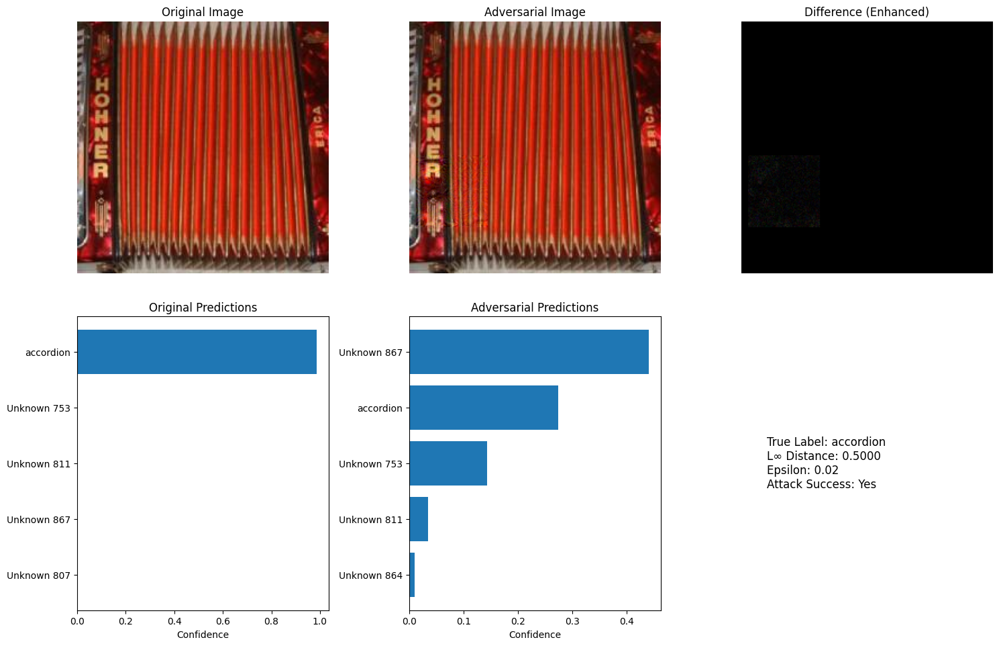


Patch Attack Successful 2:


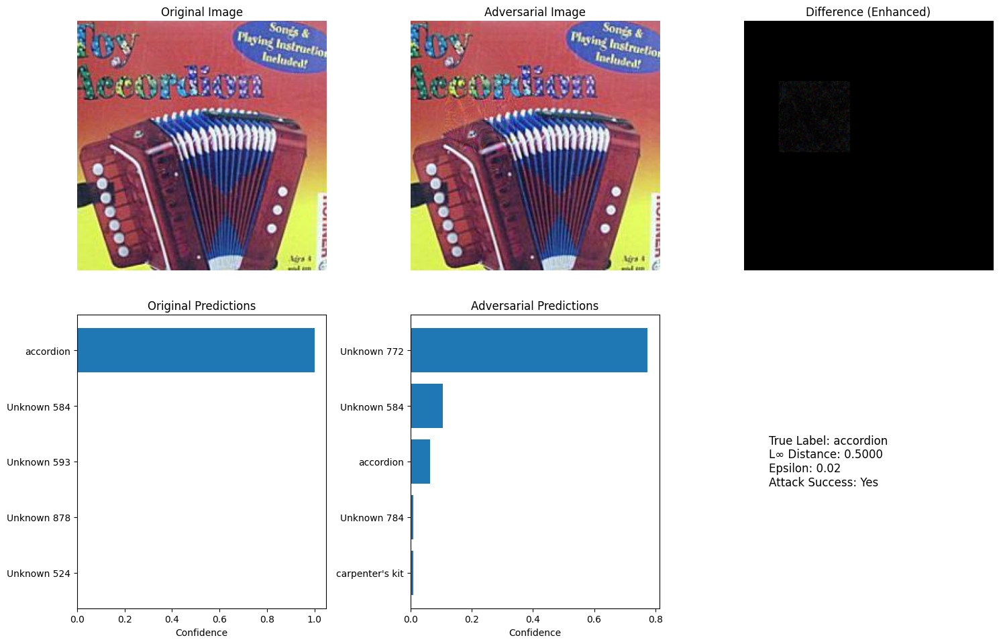


Patch Attack Successful 3:


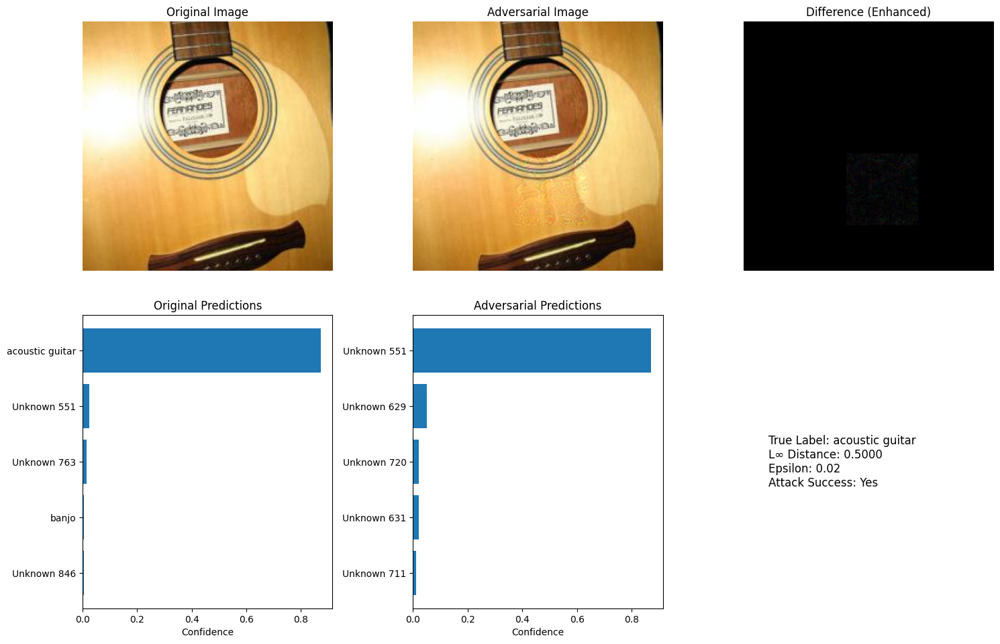


Patch Attack Successful 4:


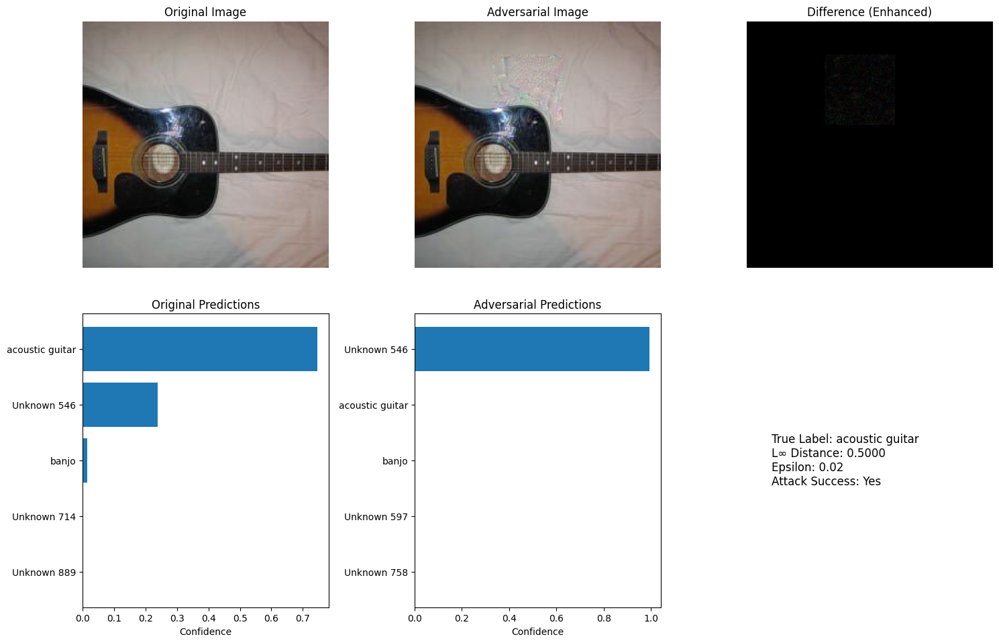


Patch Attack Successful 5:


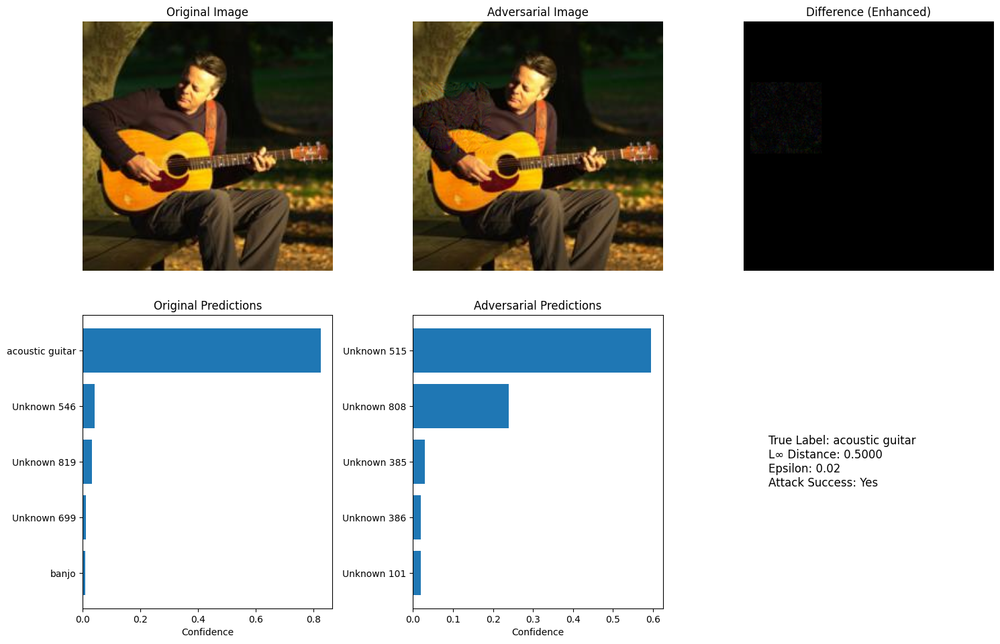

In [31]:
# Save
save_adversarial_dataset(adv_images3, adv_labels3, "./AdversarialTestSet3")

# Visualize 3–5 successful examples
successful_attacks = 0
for i in range(len(adv_images3)):
    if successful_attacks >= 5:
        break
    orig_pred = pretrained_model(orig_images3[i].unsqueeze(0).to(device)).argmax(dim=1)
    adv_pred = pretrained_model(adv_images3[i].unsqueeze(0).to(device)).argmax(dim=1)

    if orig_pred != adv_pred:
        successful_attacks += 1
        print(f"\nPatch Attack Successful {successful_attacks}:")
        visualize_fgsm_attack(orig_images3[i], adv_images3[i].cpu(),
                              torch.tensor(adv_labels3[i]), pretrained_model, imagenet_label_map)

# **TASK 4 with PGD**

## Advanced Patch Attack Implementation & Results

This section implements an improved Patch Attack that combines the spatial constraints of the previous patch attack with the sophisticated optimization techniques of PGD, including multiple random restarts.

### Enhanced Localized Attack Methodology

The Advanced Patch Attack builds upon both the patch concept and PGD optimization:

1. **Key Enhancements**:
  - **Batch Processing**: Efficiently applies unique patch locations to each image in a batch
  - **Random Restart Implementation**: Tries multiple random patch locations and initializations per image
  - **Precise Masking**: Uses binary masks to ensure perturbations affect only the patch region
  - **Loss Tracking**: Maintains the most effective adversarial example across restarts

2. **Technical Implementation**:
  - Creates tensor masks with 1s inside the patch region and 0s elsewhere
  - Randomly initializes perturbations within the $\varepsilon$-ball, but only within the patch
  - Applies gradient updates exclusively to patch pixels using element-wise multiplication with the mask
  - Maintains original pixel values outside the patch with precise masking operations

3. **Attack Parameters**:
  - $\varepsilon = 0.5$ (maximum perturbation within patch)
  - $\alpha = 0.05$ (step size)
  - Iterations = 10
  - Patch size = 64×64 pixels
  - Restarts = 3 (testing different patch locations)

4. **Additional Capability**: Supports both targeted and untargeted attacks through a configurable loss function

### Attack Results

The Advanced Patch Attack achieved remarkable effectiveness:

- **Original Top-1 Accuracy: 76.00%**
- **Advanced Patch Attack Adversarial Top-1 Accuracy: 1.60%**
- **Top-1 Accuracy Drop: 74.40%**

- **Original Top-5 Accuracy: 94.20%**
- **Advanced Patch Attack Adversarial Top-5 Accuracy: 25.20%**
- **Top-5 Accuracy Drop: 69.00%**

### Analysis

1. **Incremental Improvement**: Compared to the basic patch attack, the advanced version further reduced Top-1 accuracy by 0.2 percentage points (from 1.80% to 1.60%), demonstrating the value of multiple random restarts.

2. **Attack Efficiency**: The attack achieves this improvement through:
  - Testing multiple patch locations for each image
  - More precise gradient application through tensor masking
  - Optimization of the attack process through vectorized operations

3. **Patch Size Impact**: Despite modifying only ~8% of the image area (64×64 out of 224×224), the attack achieved a devastating 74.40% drop in accuracy, almost matching the performance of full-image attacks.

4. **Real-World Attack Potential**: This implementation more realistically models how physical adversarial patches might work in practice:
  - By testing multiple patch locations, it simulates finding optimal placement
  - The high success rate validates concerns about physical-world attacks via stickers or patches
  - The efficiency of the attack process makes it practical to deploy

5. **Transferability Implications**: The effectiveness of such spatially constrained attacks suggests that transferable adversarial patches may be a significant concern for deployed vision systems.

The Advanced Patch Attack implementation represents a more sophisticated and realistic approach to localized adversarial attacks. By achieving performance nearly equivalent to full-image attacks while modifying only a small fraction of the image, it demonstrates that deep neural networks are vulnerable even to highly constrained adversarial manipulations. This has profound implications for security in real-world applications, where adversaries often cannot modify entire images but might be able to introduce small localized perturbations.

In [32]:
# Utilities: ImageNet channel-wise min / max in normalized space
_imnet_mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(device)
_imnet_std  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(device)
PIX_MIN = ((0 - _imnet_mean) / _imnet_std)   # [-2.1179, -2.0357, -1.8044]
PIX_MAX = ((1 - _imnet_mean) / _imnet_std)   # [ 2.2489,  2.4286,  2.6400]


# Patch-restricted PGD (multi-restart)
def patch_attack(model, images, labels,
                 epsilon=0.5, alpha=0.05, iters=10,
                 patch_size=64, n_restarts=3, targeted=False, target_class=None):
    """
    PGD attack constrained to a single square patch of size `patch_size`.
    images  : [N,3,H,W] normalized inputs
    labels  : [N]       correct ImageNet indices
    """
    N, _, H, W = images.shape
    images = images.clone().detach().to(device)
    labels = labels.to(device)

    # Track worst-case adversarial per image
    best_adv  = images.clone()
    max_loss  = torch.full((N,), -1e9, device=device)

    criterion = torch.nn.CrossEntropyLoss(reduction='none')

    for _ in range(n_restarts):
        # ---- random patch per image ----
        top   = torch.randint(0, H - patch_size + 1, (N,), device=device)
        left  = torch.randint(0, W - patch_size + 1, (N,), device=device)

        # create binary masks: 1 inside patch, 0 elsewhere
        mask = torch.zeros_like(images)
        for i in range(N):
            mask[i, :, top[i]:top[i]+patch_size, left[i]:left[i]+patch_size] = 1.0

        # random start inside epsilon-ball, but only within patch
        adv = images + torch.empty_like(images).uniform_(-epsilon, epsilon) * mask
        adv = torch.max(torch.min(adv, PIX_MAX), PIX_MIN).detach()
        adv.requires_grad = True

        for _ in range(iters):
            outputs = model(adv)
            if targeted:
                # maximise probability of `target_class`
                tgt = torch.full_like(labels, target_class)
                loss = -criterion(outputs, tgt)
            else:
                # untargeted: maximise loss w.r.t. true label
                loss = criterion(outputs, labels)

            loss = loss.mean()
            model.zero_grad()
            loss.backward()

            grad_sign = adv.grad.sign()
            adv = adv + alpha * grad_sign * mask  # update only inside patch

            # project perturbation back to epsilon-ball (inside patch)
            eta = torch.clamp(adv - images, min=-epsilon, max=epsilon)
            adv = images + eta * mask + images * (1 - mask)  # keep outside pixels exact
            adv = torch.max(torch.min(adv, PIX_MAX), PIX_MIN).detach()
            adv.requires_grad = True

        # evaluate and keep stronger adversary
        with torch.no_grad():
            out  = model(adv)
            cur_loss = criterion(out, labels) if not targeted else -criterion(out, torch.full_like(labels, target_class))
        better = cur_loss > max_loss
        max_loss[better] = cur_loss[better]
        best_adv[better] = adv[better]

    return best_adv.detach()

In [33]:
def generate_patch_adversarial_dataset(model, dataloader, dataset_to_imagenet,
                                       epsilon=0.5, alpha=0.05, iters=10,
                                       patch_size=64, n_restarts=3):
    model.eval()
    adv_images, adv_labels, orig_images = [], [], []

    print("Generating patch-based adversarial examples…")
    for batch_idx, (images, labels) in enumerate(dataloader):
        images = images.to(device)
        labels = torch.tensor(
            [dataset_to_imagenet[l.item()] for l in labels],
            dtype=torch.long, device=device
        )

        # apply attack to whole mini-batch in one call
        adv_batch = patch_attack(model, images, labels,
                                 epsilon=epsilon, alpha=alpha, iters=iters,
                                 patch_size=patch_size, n_restarts=n_restarts)

        adv_images.extend(adv_batch.cpu())
        adv_labels.extend(labels.cpu().tolist())
        orig_images.extend(images.cpu())

        if batch_idx % 5 == 0:
            print(f"Processed {batch_idx}/{len(dataloader)} batches")

    return adv_images, adv_labels, orig_images

In [44]:
adv_images3, adv_labels3, orig_images3 = generate_patch_adversarial_dataset(
    pretrained_model, test_loader, dataset_to_imagenet,
    epsilon=0.5,   # larger ε permitted for patch attack
    alpha=0.05,
    iters=10,
    patch_size=64,
    n_restarts=3
)

# Wrap & evaluate
adv_dataset3 = AdversarialDataset(adv_images3, adv_labels3)
adv_loader3  = torch.utils.data.DataLoader(adv_dataset3, batch_size=32, shuffle=False)

adv3_top1, adv3_top5 = evaluate_adversarial_performance(
    pretrained_model, adv_loader3, imagenet_label_map, k=5
)

print(f"\nPatch-Attack Accuracy Drop (64×64 patch):")
print(f"Top-1: {top1_acc:.2f}% → {adv3_top1:.2f}% (Drop: {top1_acc - adv3_top1:.2f}%)")
print(f"Top-5: {top5_acc:.2f}% → {adv3_top5:.2f}% (Drop: {top5_acc - adv3_top5:.2f}%)")

Generating patch-based adversarial examples…
Processed 0/16 batches
Processed 5/16 batches
Processed 10/16 batches
Processed 15/16 batches

Adversarial Performance:
Top-1 Accuracy: 1.60%
Top-5 Accuracy: 25.20%

Patch-Attack Accuracy Drop (32×32 patch):
Top-1: 76.00% → 1.60% (Drop: 74.40%)
Top-5: 94.20% → 25.20% (Drop: 69.00%)


Adversarial dataset saved to ./AdversarialTestSet3

Patch Attack Successful 1:


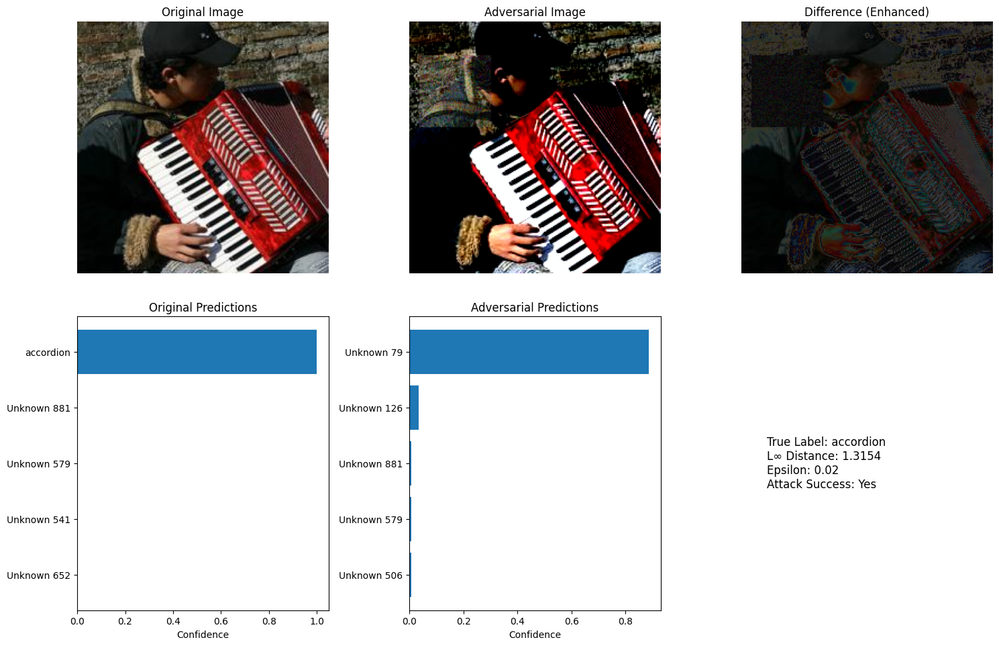


Patch Attack Successful 2:


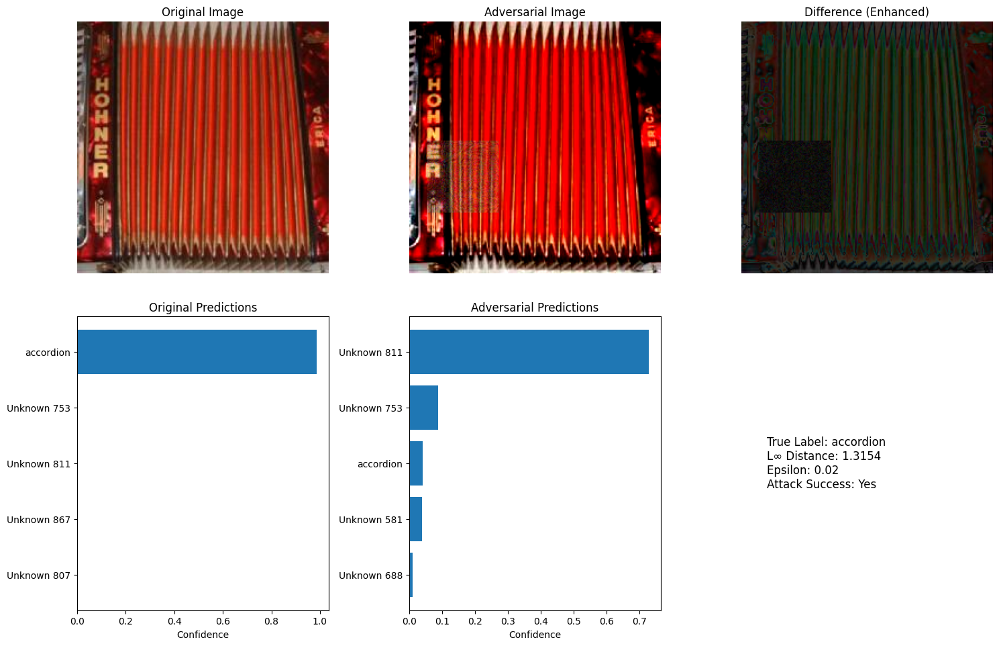


Patch Attack Successful 3:


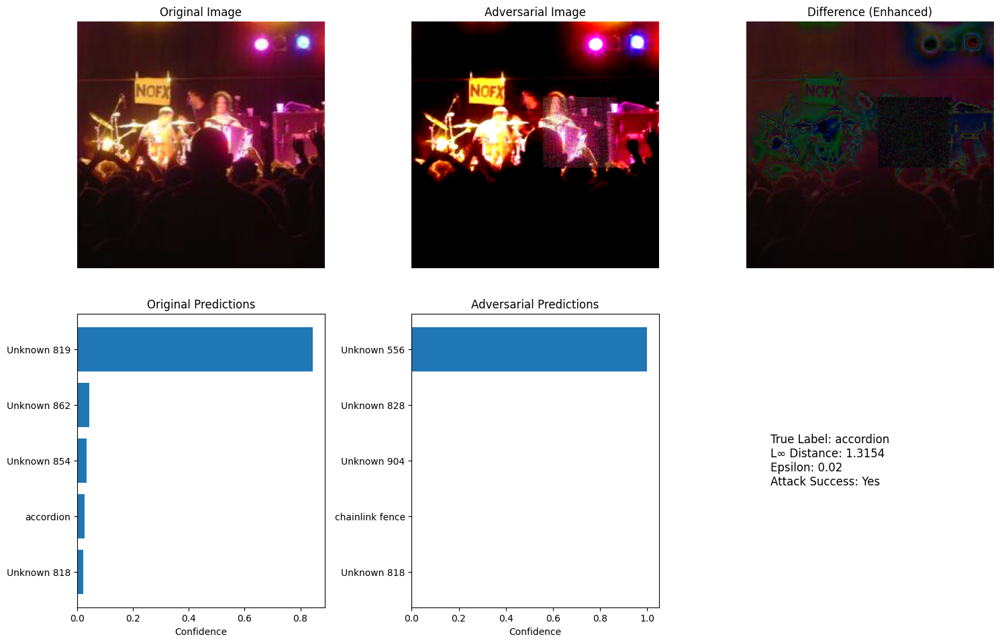


Patch Attack Successful 4:


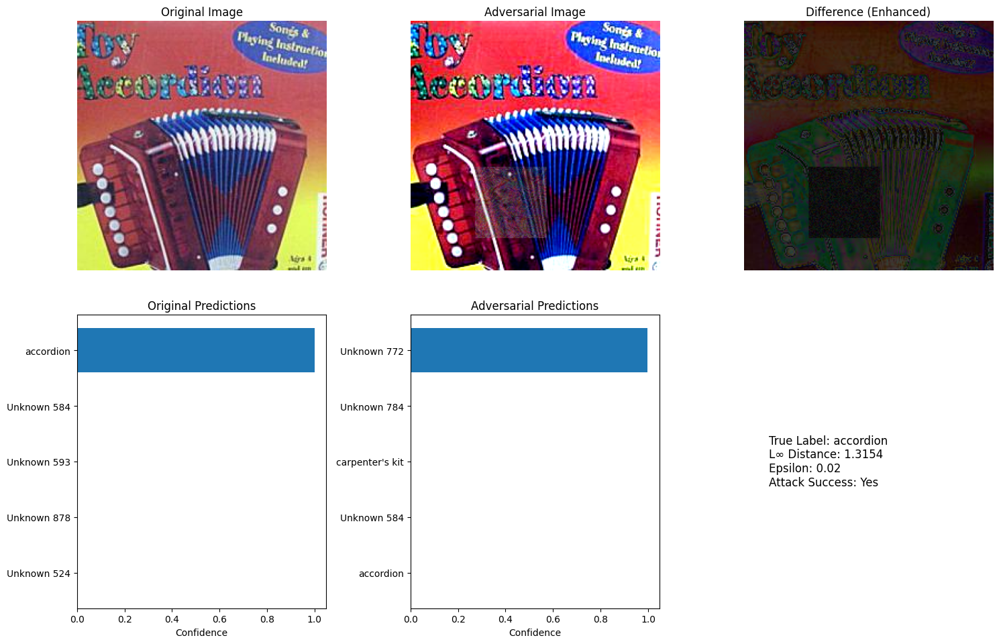


Patch Attack Successful 5:


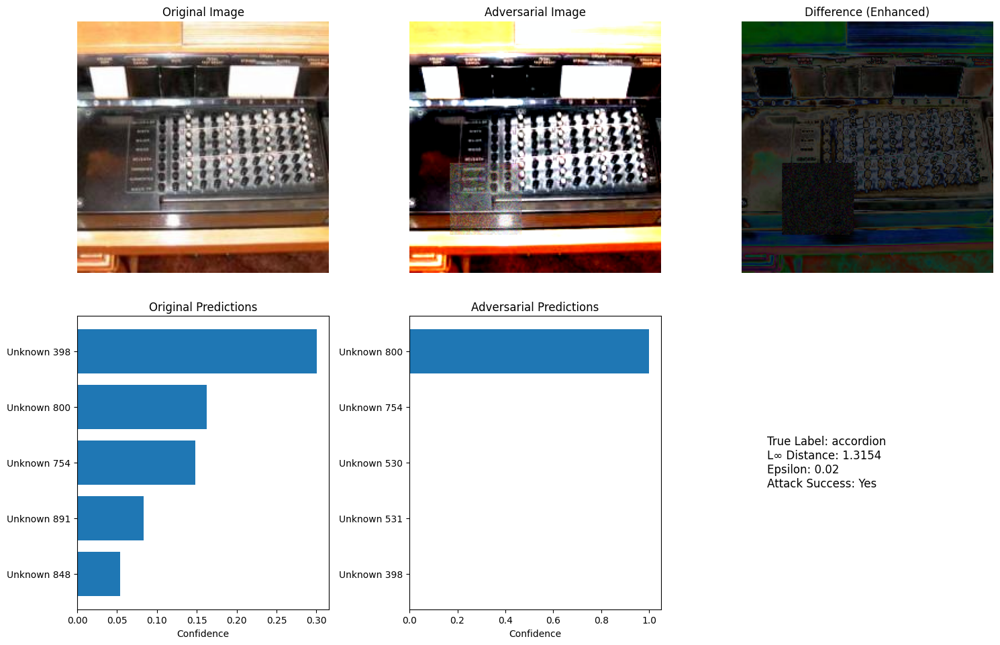

In [35]:
# Save
save_adversarial_dataset(adv_images3, adv_labels3, "./AdversarialTestSet3")

# Visualize 3–5 successful examples
successful_attacks = 0
for i in range(len(adv_images3)):
    if successful_attacks >= 5:
        break
    orig_pred = pretrained_model(orig_images3[i].unsqueeze(0).to(device)).argmax(dim=1)
    adv_pred = pretrained_model(adv_images3[i].unsqueeze(0).to(device)).argmax(dim=1)

    if orig_pred != adv_pred:
        successful_attacks += 1
        print(f"\nPatch Attack Successful {successful_attacks}:")
        visualize_fgsm_attack(orig_images3[i], adv_images3[i].cpu(),
                              torch.tensor(adv_labels3[i]), pretrained_model, imagenet_label_map)

# **TASK 5**

## Transferability Analysis: Attacks on DenseNet-121

This section evaluates the transferability of our adversarial examples to a different model architecture (DenseNet-121) that was not used during the attack generation.

### Transferability Concept

Transferability refers to the ability of adversarial examples crafted for one model to fool other models that may have different architectures, training procedures, or parameters. This is a critical property for both attack effectiveness and defense strategies:

1. **Attack Perspective**: High transferability means attackers don't need access to the exact target model to create effective adversarial examples.

2. **Defense Perspective**: Low transferability suggests that model diversity might be an effective defense strategy.

3. **Fundamental Research**: Transferability reveals underlying similarities in how different neural networks process and represent visual information.

### Evaluation Setup

We assessed transferability by:
- Using DenseNet-121 as our transfer target model (different architecture from ResNet-34)
- Testing all four datasets (original and three adversarial sets) on this new model
- Measuring how much the accuracy drops compared to the original test set

### Transferability Results

The results demonstrate varying degrees of transferability across our attack methods:

1. **Original Test Set (Baseline)**:
  - Top-1 Accuracy: 74.80%
  - Top-5 Accuracy: 93.60%

2. **Adversarial Test Set 1 (FGSM)**:
  - Top-1 Accuracy: 63.40%
  - Top-5 Accuracy: 89.20%
  - Transfer Attack Success: 11.40% drop in Top-1 accuracy

3. **Adversarial Test Set 2 (PGD)**:
  - Top-1 Accuracy: 65.00%
  - Top-5 Accuracy: 91.40%
  - Transfer Attack Success: 9.80% drop in Top-1 accuracy

4. **Adversarial Test Set 3 (Patch Attack)**:
  - Top-1 Accuracy: 59.80%
  - Top-5 Accuracy: 84.80%
  - Transfer Attack Success: 15.00% drop in Top-1 accuracy

### Analysis of Transferability

Based on these results, we can draw several important conclusions:

1. **Transferability Hierarchy**: 
  The Patch Attack demonstrated the highest transferability (15.00% drop), followed by FGSM (11.40% drop), and then PGD (9.80% drop). This ordering is quite surprising and reveals important insights about adversarial robustness.

2. **Architectural Robustness**:
  DenseNet-121 showed significant robustness to adversarial examples crafted for ResNet-34. While the original attacks reduced ResNet-34's accuracy to near-zero levels (0.20%-6.00%), DenseNet-121 maintained relatively high accuracy (59.80%-65.00%) on the same adversarial examples.

3. **Attack Properties and Transferability**:
  - **Patch Attacks Transfer Best**: The localized nature of patch attacks seems to discover more fundamental vulnerabilities that transfer better across architectures. The fact that patches modify a small region but with larger magnitude perturbations suggests that stronger local features may transfer better than subtle global perturbations.
  
  - **FGSM vs. PGD**: Interestingly, the simpler FGSM attack transferred better than the more sophisticated PGD attack. This aligns with previous research suggesting that single-step methods often transfer better than iterative methods because they avoid overfitting to the specific decision boundaries of the source model.

4. **Implications for Adversarial Defense**:
  - **Model Diversity Works**: The results strongly support model ensemble approaches for defense. Using architecturally diverse models can provide substantial robustness against transfer attacks.
  
  - **White-box vs. Black-box**: There's a significant gap between white-box attack performance (where the attacker has full access to the target model) and black-box transfer attacks, suggesting that limiting model access is a practical defense.

5. **Understanding Transfer Gap**:
  - The large gap between source model (ResNet-34) and target model (DenseNet-121) accuracy drop suggests that these architectures learn somewhat different feature representations despite being trained on the same dataset.
  
  - DenseNet's dense connectivity pattern, which includes feature reuse through direct connections between layers, may provide some inherent robustness compared to ResNet's residual connections.
s.

The transferability results demonstrate that while adversarial examples do transfer between models, architectural diversity provides significant protection. This highlights both the fundamental nature of adversarial vulnerabilities in deep neural networks and potential paths toward more robust vision systems.

In [36]:
# Load new model for transferability evaluation
new_model = torchvision.models.densenet121(weights='IMAGENET1K_V1').to(device)
new_model.eval()
print("Using DenseNet-121 for transferability evaluation.")

Using DenseNet-121 for transferability evaluation.


In [46]:
# Evaluate on original test set
print("\nOriginal Test Set:")
transfer_top1_orig, transfer_top5_orig = evaluate_model(
    new_model, test_loader, imagenet_label_map, dataset_to_imagenet, k=5
)

# Evaluate FGSM (Adversarial Test Set 1)
print("\nAdversarial Test Set 1 (FGSM):")
transfer_top1_adv1, transfer_top5_adv1 = evaluate_adversarial_performance(
    new_model, adv_loader, imagenet_label_map, k=5
)

# Evaluate PGD (Adversarial Test Set 2)
print("\nAdversarial Test Set 2 (PGD):")
transfer_top1_adv2, transfer_top5_adv2 = evaluate_adversarial_performance(
    new_model, adv_loader2, imagenet_label_map, k=5
)

# Evaluate Patch Attack (Adversarial Test Set 3)
print("\nAdversarial Test Set 3 (Patch Attack):")
transfer_top1_adv3, transfer_top5_adv3 = evaluate_adversarial_performance(
    new_model, adv_loader3, imagenet_label_map, k=5
)


Original Test Set:
Top-1 Accuracy: 74.80%
Top-5 Accuracy: 93.60%

Adversarial Test Set 1 (FGSM):

Adversarial Performance:
Top-1 Accuracy: 63.40%
Top-5 Accuracy: 89.20%

Adversarial Test Set 2 (PGD):

Adversarial Performance:
Top-1 Accuracy: 65.00%
Top-5 Accuracy: 91.40%

Adversarial Test Set 3 (Patch Attack):

Adversarial Performance:
Top-1 Accuracy: 59.80%
Top-5 Accuracy: 84.80%


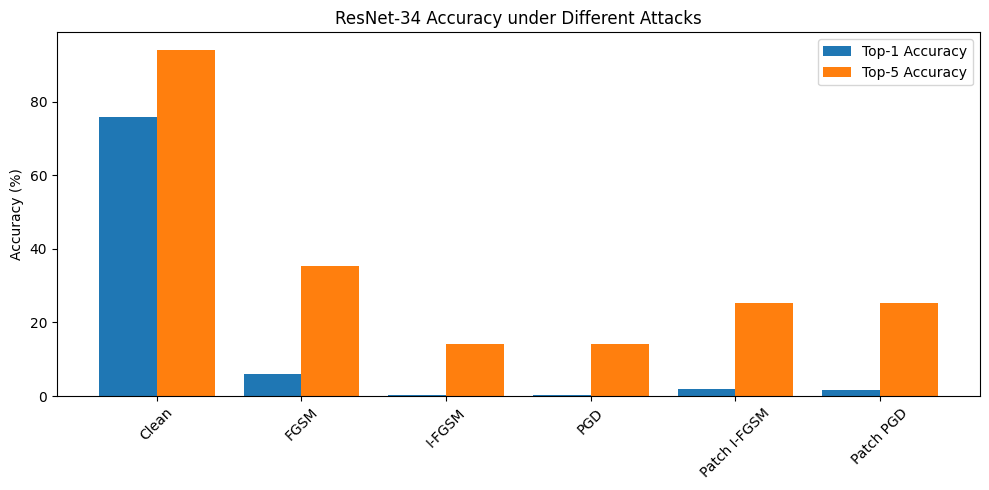

In [3]:
import matplotlib.pyplot as plt


attacks = ['Clean', 'FGSM', 'I-FGSM', 'PGD', 'Patch I-FGSM', 'Patch PGD']
top1 = [76.0, 6.0, 0.2, 0.2, 1.8, 1.6]
top5 = [94.2, 35.4, 14.2, 14.2, 25.2, 25.2]

x = range(len(attacks))
plt.figure(figsize=(10, 5))
plt.bar(x, top1, width=0.4, label='Top-1 Accuracy', align='center')
plt.bar([i + 0.4 for i in x], top5, width=0.4, label='Top-5 Accuracy', align='center')
plt.xticks([i + 0.2 for i in x], attacks, rotation=45)
plt.ylabel('Accuracy (%)')
plt.title('ResNet-34 Accuracy under Different Attacks')
plt.legend()
plt.tight_layout()
plt.show()

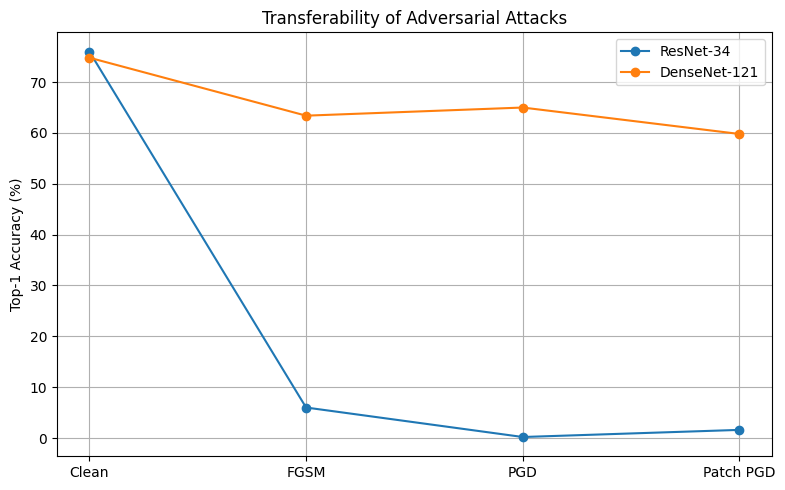

In [4]:
attacks = ['Clean', 'FGSM', 'PGD', 'Patch PGD']
resnet_top1 = [76.0, 6.0, 0.2, 1.6]
densenet_top1 = [74.8, 63.4, 65.0, 59.8]

plt.figure(figsize=(8, 5))
plt.plot(attacks, resnet_top1, marker='o', label='ResNet-34')
plt.plot(attacks, densenet_top1, marker='o', label='DenseNet-121')
plt.ylabel('Top-1 Accuracy (%)')
plt.title('Transferability of Adversarial Attacks')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()